# Álgebra Linear Numérica - Trabalho de Reconhecimento Facial
### Grupo: Gabriel Andrade, Jhonatan Gomes e Virgínia Balbo

# Introdução


<p> Em nosso trabalho, iremos achar meios de resolver o problema de reconhecimento de faces com o uso de dois algorítimos de reconhececimento facial desenvolvidos por nosso grupo, um de força bruta e outro por PCA (análise de principais componentes), suas taxas de precisão , discussões e conclusões que pudemos tirar desses algoritimos. </p>   


# Teoria

## Algoritimo de força bruta


<p> O algoritimo de força bruta basicamente vai fazer uma análise comparativa de pixel a pixel de uma imagem de teste e as de treino e vai classificá-la em uma das classes de imagem através da norma da diferença, a menor norma obtida classifica a imagem. </p>


## Algorítimo de PCA

<p> A PCA (analise de principais componentes) por definição é um procedimento matemático que utiliza uma transformação ortogonal (ortogonalização de vetores) para converter um conjunto de observações de variáveis possivelmente correlacionadas num conjunto de valores de variáveis linearmente não correlacionadas chamadas de componentes principais. Na nossa tarefa, vamos fazer uma análise comparativa dos componentes principais da imagem teste com os principais componentes das imagens de treino. </p>

# Processo de concepção dos algorítimos

<p> Primeiro vamos ler as nossas imagens de treino e agrupá-las de acordo com a classe. Cada imagem então é armazenada em uma matriz de imagens 100x100x3 (onde esse 3 são as cores em R, G e B da imagem) e após isso pegamos uma imagem do conjunto de teste, comparamos com cada imagem do treino, pegamos norma da diferença da imagem teste com a imagem de treino para a força bruta e a norma da diferença dos principais componentes no método da PCA e por fim, classificamos em uma das classes no menor valor dessa norma. De maneira simplificada é como se agrupassemos um conjunto das nossas imagens nas classes (de maneira mais precisa, se trata de um clustering dos dados de treino), pegassemos uma imagem teste e classificassemos de acordo com a proximidade dela em relação a cada classe e quanto maior a quantidade de dados que temos de treinamento mais preciso ele ,é pois ele consegue achar valores mais proximos. </p>

# Discuções e resultados

## Comparação de taxa de acerto
Algoritimo	   Taxa de acerto medio


Força bruta	   30%


PCA	           86%

## Discussões
<p> O algoritimo de força bruta não foi capaz de reconhecer diversas faces, o que mostra que o algorítimo de força bruta não é muito eficiente. Outra constatação que obtivemos foi a que quanto  maior a complexidade do teste, mais preciso ele se tornava, por exemplo: em testes realizados com a base de dados “very-easy”  foi obtida uma precisão baixa no algorítmo de força bruta pois só havia uma imagem de treino por classe. Na base de dados easy os resultados melhoraram pois haviam mais dados de treinamento o que é consistente com a teoria apresentada. O método da PCA, ao ser utilizado, melhorou os resultados. </p>
<p> Uma ideia para testar futuramente seria aplicar processamentos de imagem como, por exemplo, redução de ruído e equalização de histograma, para tentar obter melhores resultados. </p>

# Conclusões 

<p> Com tudo que foi apresentado podemos concluir que foi gerado um reconhecedor capaz de reconhecer uma quantidade ótima de imagens, o resultado utilizando PCA foi satisfatório e mesmo o força bruta foi capaz de reconhecer diversas faces. </p>

# Bibliografia

- https://pt.wikipedia.org/wiki/An%C3%A1lise_de_componentes_principais
- http://scikit-learn.org/stable/index.html
- https://docs.scipy.org/doc/numpy-1.13.0/index.html


# Código

In [4]:
import matplotlib.pyplot as plt
import numpy as np
import math
import matplotlib.patches as mpatches
import random
import matplotlib.image as mpimg
from scipy.ndimage import convolve
import sklearn.decomposition as decomp

# Falso infinito, porém suficiente
INF = 9999999999999

# Settadas no load
PATH = ""
TRAINING_SET = {}
TEST_SET = {}

# Preenche as variaveis globais PATH, TRAINING_SET e TEST_SET
# path é o path onde estão as imagens
# tarining_set_map é o mapa de classes, passado vazio
# n é o numero de imagens por classe
# PATH recebe path
# TEST_SET recebe uma imagem de cada classe escolhida aleatoriamente
# TRAINING_SET recebe as imagens restantes e ficam agrupadas pelas classes a qual pertencem
def load(path, training_set_map, n, ext='.jpg'):
    global PATH, TRAINING_SET, TEST_SET
    PATH = path
    TRAINING_SET = training_set_map
    TEST_SET = {'all': []}
    for c in TRAINING_SET:
        a = random.randrange(n)     
        for i in range(0,n):
            file_name = c + '-' + str(i+1) + ext
            if i == a:
                TEST_SET['all'] = np.ndarray.tolist(np.append(file_name, TEST_SET['all']))
            else:
                TRAINING_SET[c] = np.ndarray.tolist(np.append(file_name, TRAINING_SET[c]))

# Lê a imagem baseada no nome do arquivo e no PATH settado na função load
def read_image(file_name):
    return mpimg.imread(PATH + file_name)

# Retorna a classe dado o nome do arquivo da imagem
def class_of(file_name):
    return file_name.split("-")[0]

# Calcula o pca da imagem X, mas antes redimenciona ela de [100][100][3] para [300][100]
def PCA(X):
    X = X.reshape(300,100)
    pca = decomp.PCA(n_components=2)
    pca.fit(X)
    return pca.transform(X)

def find_class(img,use_pca):
    diff_ = INF
    mi = []
    mc = 0
    for c in TRAINING_SET:
        for i in TRAINING_SET[c]:
            img_compare = read_image(i)
            diff_candidate = diff_candidate = np.linalg.norm(img[:,:,0:3]-img_compare[:,:,0:3])
            if (use_pca):
                diff_candidate = np.linalg.norm(PCA(img[:,:,0:3])-PCA(img_compare[:,:,0:3]))  
            if diff_candidate < diff_:
                diff_ = diff_candidate
                mi = img_compare
                mc = c
    return diff_, mi, mc

def recognize(show_result, use_pca):
    wrong = 0
    right = 0
    for fn in TEST_SET['all']:
        img = read_image(fn)
        diff_, mi, mc = find_class(img, use_pca)
        if class_of(fn) == str(mc):
            right = right + 1
        else:
            wrong = wrong + 1
        if show_result:
            if class_of(fn) == str(mc):
                print("ACERTOU")
            else:
                print("ERROU " + class_of(fn) + " =/= " + str(mc))
            print('min_norm_difference = ' + str(diff_))
            print('class = ' + str(mc))
            f, (plt0, plt1) = plt.subplots(1, 2, figsize=(10,5))
            plt0.imshow(img)
            plt1.imshow(mi)
            plt.show()
    return (right*100.)/(right+wrong)

def test(k, use_pca, path, training_set_map, n, ext='.jpg'):
    percent_sum = 0
    for i in range(k):
        load(path, training_set_map, n, ext)
        percent_sum = percent_sum + recognize(False, use_pca)
    return float(percent_sum)/k

# Resultados para as bases very_easey, easy, medium e extra usando força bruta e PCA

## VERY_EASY COM FORÇA BRUTA

ERROU 87 =/= 16
min_norm_difference = 20905.590639826467
class = 16


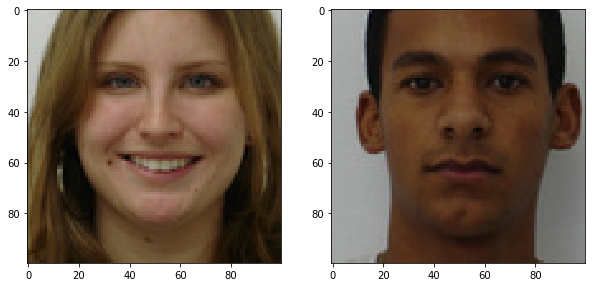

ACERTOU
min_norm_difference = 25146.050544767462
class = 16


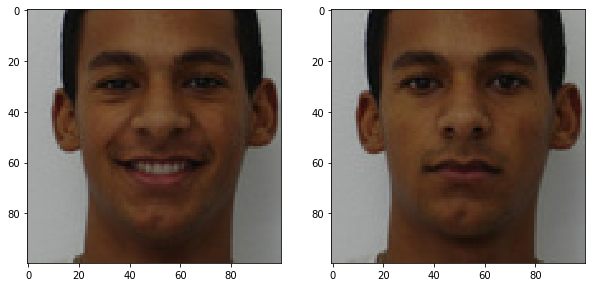

ERROU 15 =/= 16
min_norm_difference = 19888.417282428483
class = 16


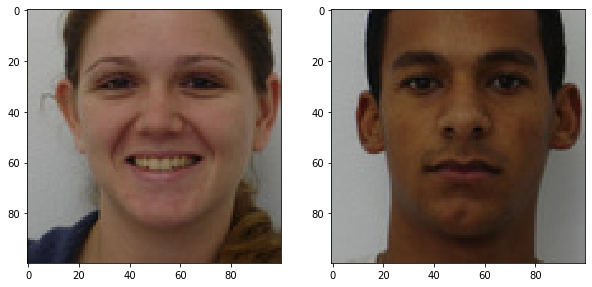

ERROU 11 =/= 16
min_norm_difference = 20260.128207886544
class = 16


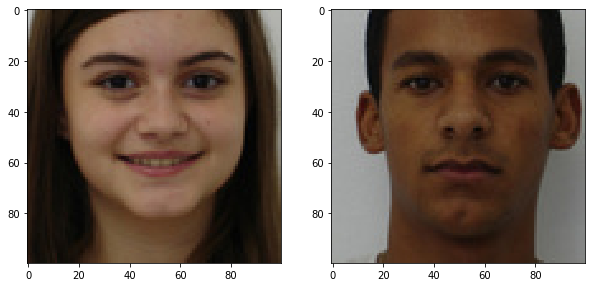

ERROU 2 =/= 16
min_norm_difference = 19786.292603719376
class = 16


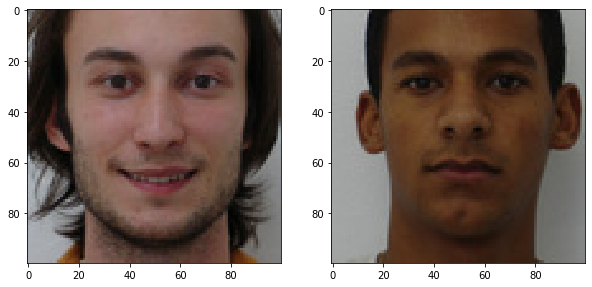

20.0% de acerto


In [5]:
load('recdev/very-easy/', {'2': [], '11': [], '15': [], '16': [], '87': []}, 2)
percent = recognize(True, False)
print(str(percent) + "% de acerto")

## VERY_EASY COM PCA

ACERTOU
min_norm_difference = 2073.127131600203
class = 87


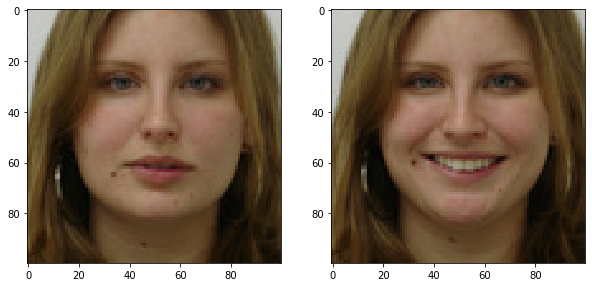

ACERTOU
min_norm_difference = 1313.0646928920473
class = 16


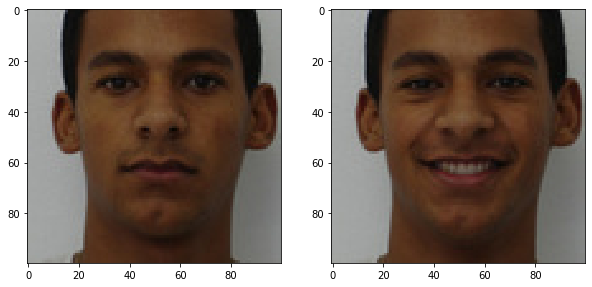

ACERTOU
min_norm_difference = 1482.9097459295558
class = 15


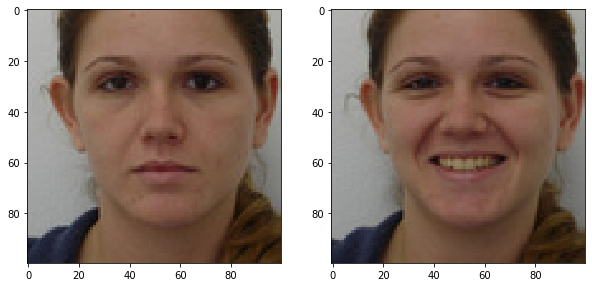

ACERTOU
min_norm_difference = 1332.5396329805435
class = 11


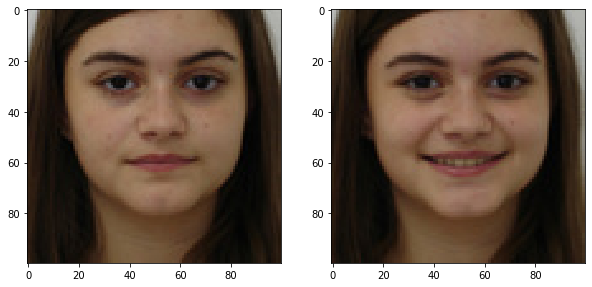

ERROU 2 =/= 11
min_norm_difference = 7404.081262007802
class = 11


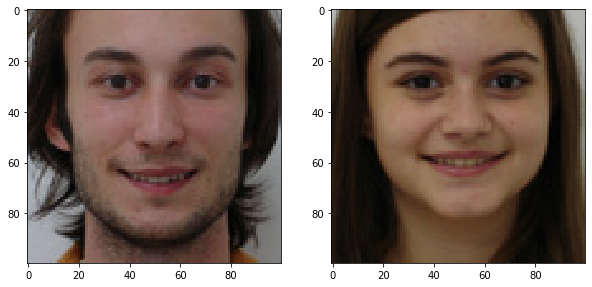

80.0% de acerto


In [6]:
load('recdev/very-easy/', {'2': [], '11': [], '15': [], '16': [], '87': []}, 2)
percent = recognize(True, True)
print(str(percent) + "% de acerto")

## EASY COM FORÇA BRUTA

ERROU 87 =/= 15
min_norm_difference = 9206.186072418914
class = 15


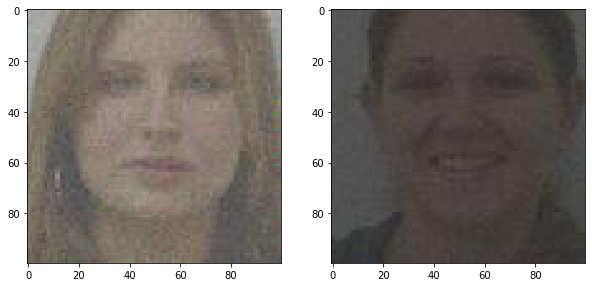

ACERTOU
min_norm_difference = 26173.694867175327
class = 16


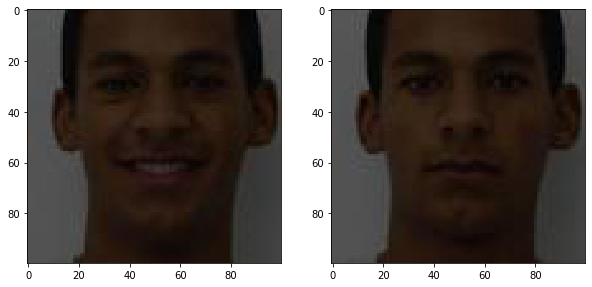

ACERTOU
min_norm_difference = 9519.8502089056
class = 15


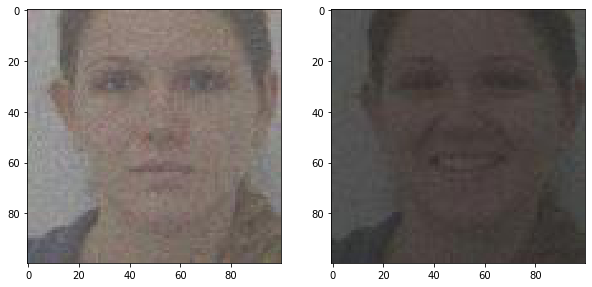

ERROU 11 =/= 16
min_norm_difference = 23362.342391121656
class = 16


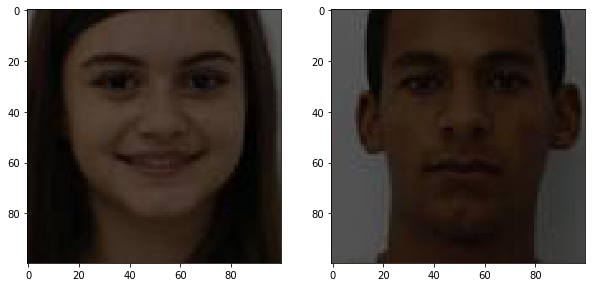

ACERTOU
min_norm_difference = 10890.135995477742
class = 2


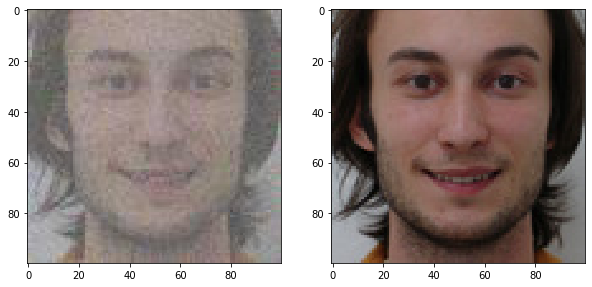

60.0% de acerto


In [7]:
load('recdev/easy/', {'2': [], '11': [], '15': [], '16': [], '87': []}, 8)
percent = recognize(True, False)
print(str(percent) + "% de acerto")

## EASY COM PCA

ACERTOU
min_norm_difference = 2073.127131600203
class = 87


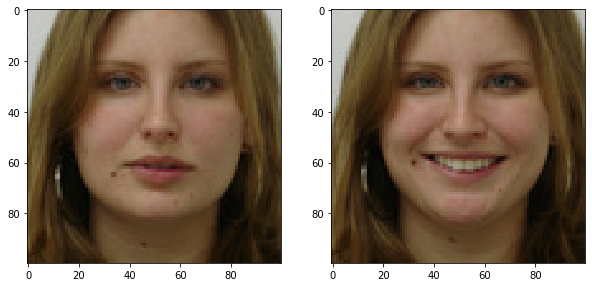

ACERTOU
min_norm_difference = 545.747933656399
class = 16


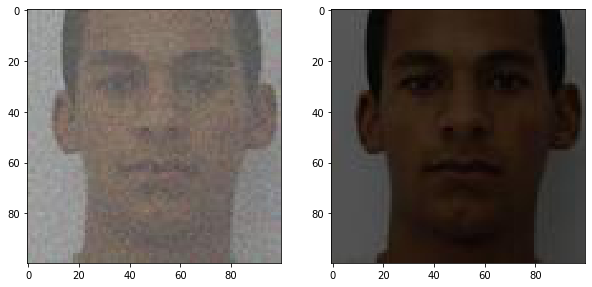

ACERTOU
min_norm_difference = 389.5610529704941
class = 15


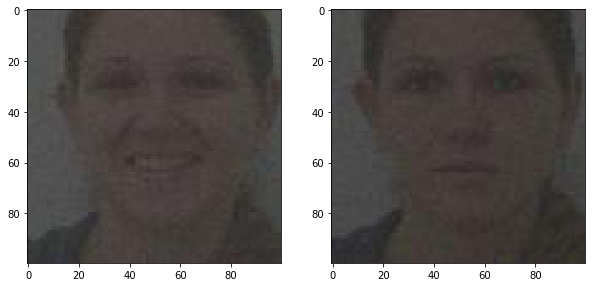

ACERTOU
min_norm_difference = 436.9099367779648
class = 11


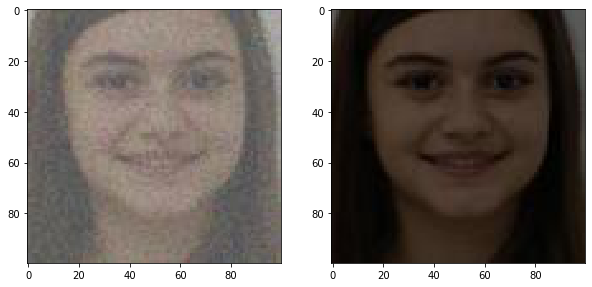

ACERTOU
min_norm_difference = 377.76453961624657
class = 2


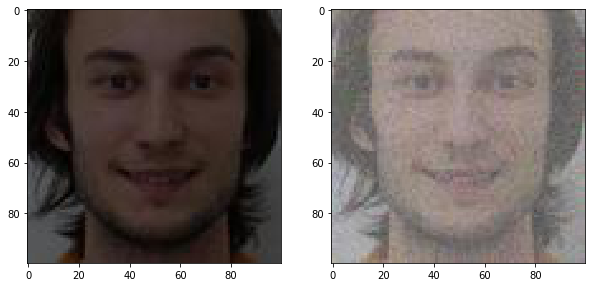

100.0% de acerto


In [8]:
load('recdev/easy/', {'2': [], '11': [], '15': [], '16': [], '87': []}, 8)
percent = recognize(True, True)
print(str(percent) + "% de acerto")

## MEDIUM COM FORÇA BRUTA

ERROU 50 =/= 1
min_norm_difference = 12200.986066707886
class = 1


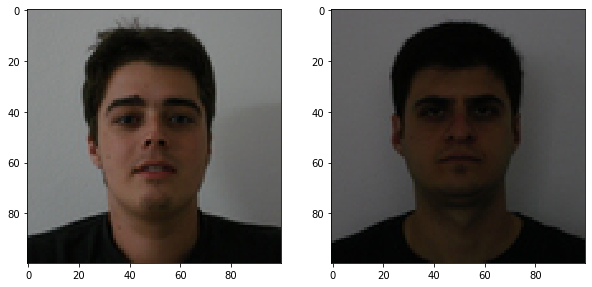

ERROU 49 =/= 1
min_norm_difference = 13907.12666225486
class = 1


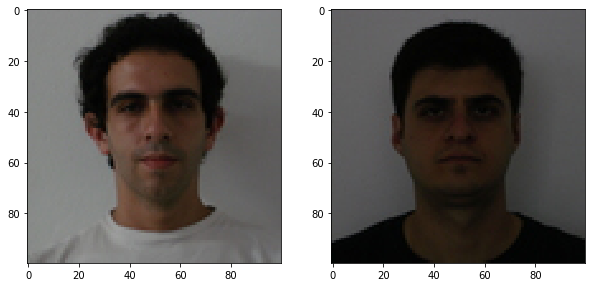

ACERTOU
min_norm_difference = 12057.119515041724
class = 48


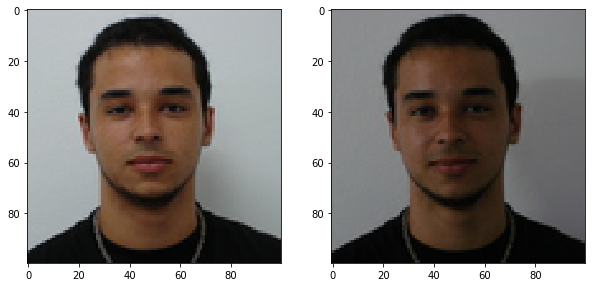

ACERTOU
min_norm_difference = 13817.941887271056
class = 47


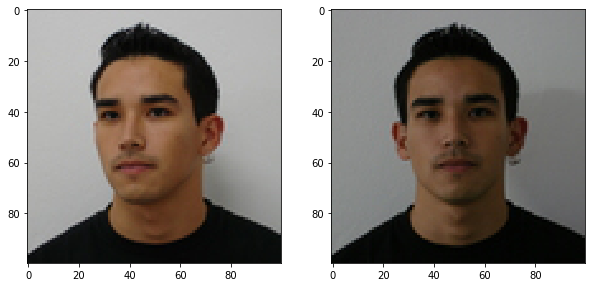

ERROU 46 =/= 38
min_norm_difference = 16926.930849979864
class = 38


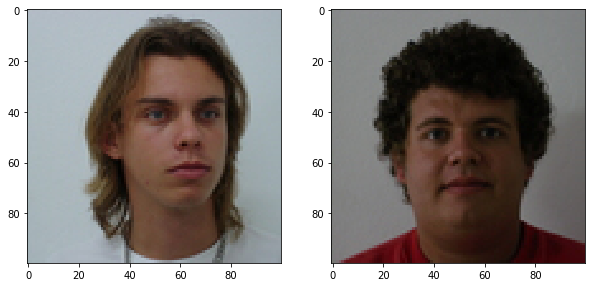

ERROU 45 =/= 38
min_norm_difference = 12289.863262054627
class = 38


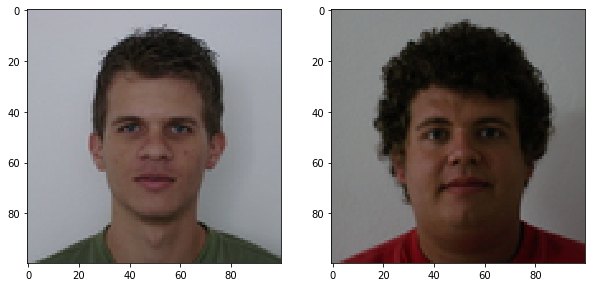

ACERTOU
min_norm_difference = 12775.671450064767
class = 44


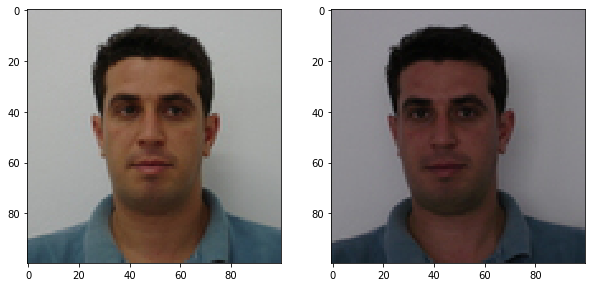

ERROU 43 =/= 37
min_norm_difference = 15585.814255277137
class = 37


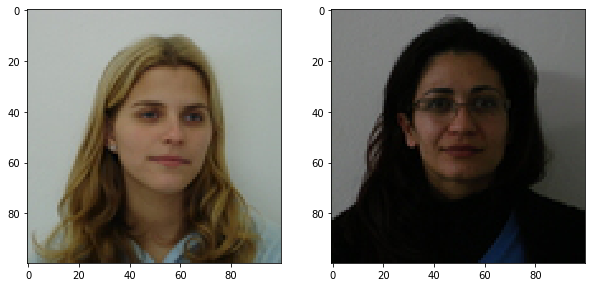

ERROU 42 =/= 38
min_norm_difference = 18415.664066223624
class = 38


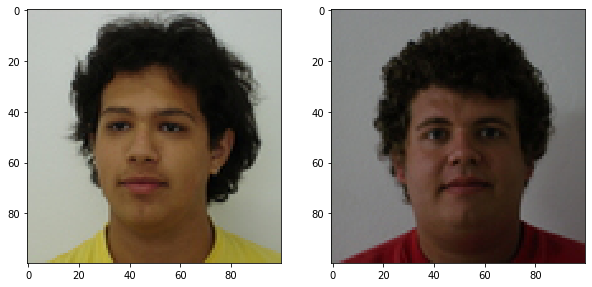

ERROU 41 =/= 47
min_norm_difference = 15555.616959799441
class = 47


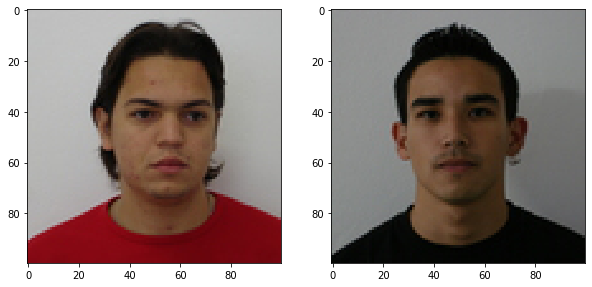

ERROU 40 =/= 33
min_norm_difference = 16715.814577818215
class = 33


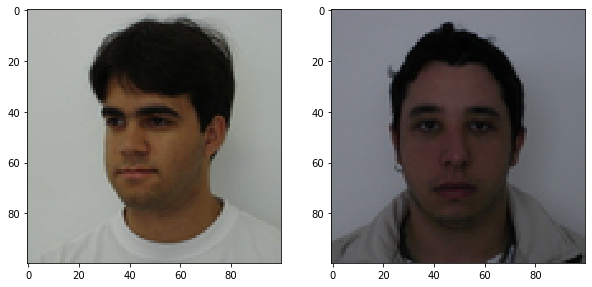

ERROU 39 =/= 37
min_norm_difference = 16716.64164836945
class = 37


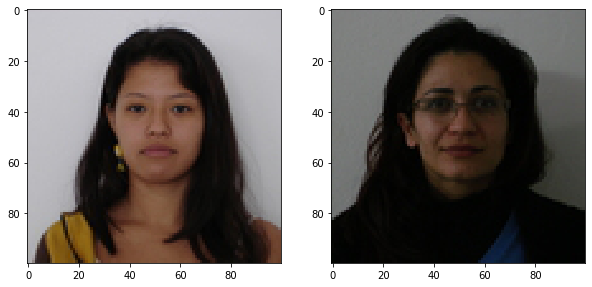

ERROU 38 =/= 37
min_norm_difference = 23702.457319864538
class = 37


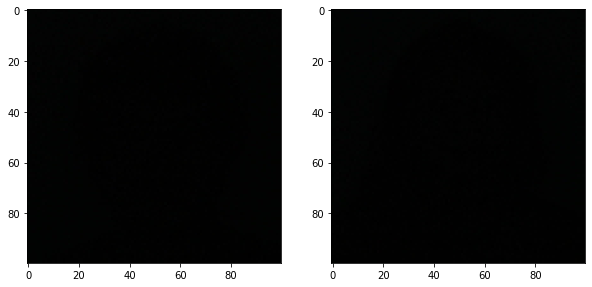

ACERTOU
min_norm_difference = 15833.821111784735
class = 37


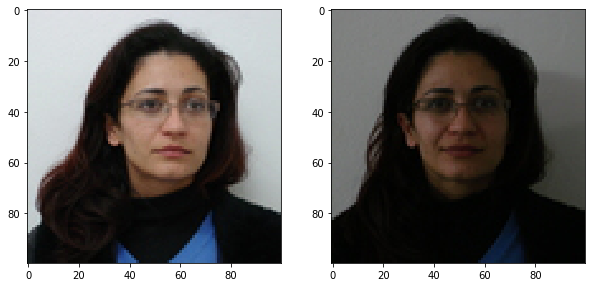

ERROU 36 =/= 47
min_norm_difference = 12998.875566755765
class = 47


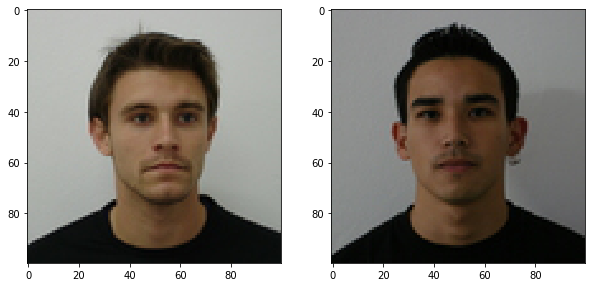

ERROU 35 =/= 1
min_norm_difference = 13527.759090108015
class = 1


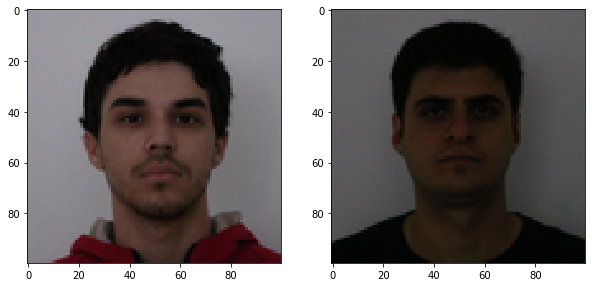

ERROU 34 =/= 37
min_norm_difference = 16226.644816473921
class = 37


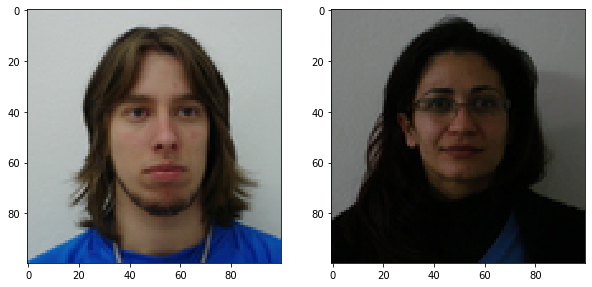

ACERTOU
min_norm_difference = 13699.609884956579
class = 33


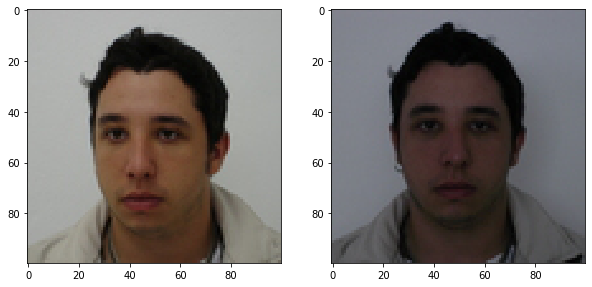

ERROU 32 =/= 16
min_norm_difference = 15370.170721237939
class = 16


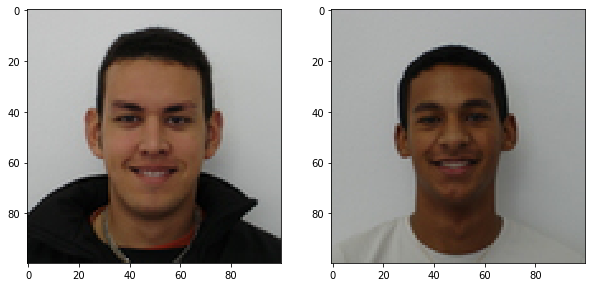

ERROU 31 =/= 14
min_norm_difference = 15804.757827945356
class = 14


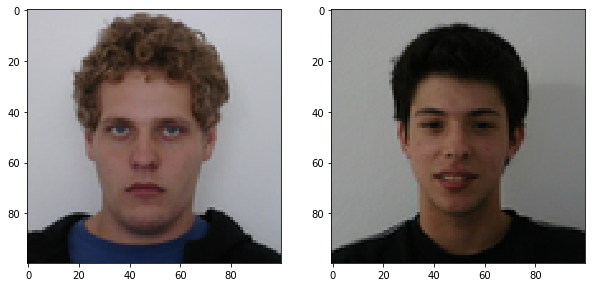

ERROU 30 =/= 37
min_norm_difference = 14712.064505024438
class = 37


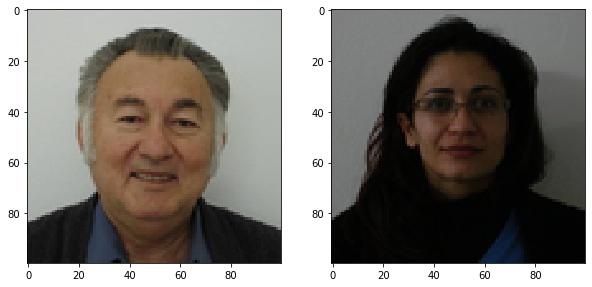

ERROU 29 =/= 14
min_norm_difference = 13774.02769708265
class = 14


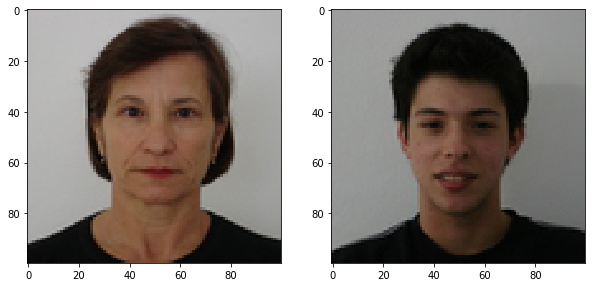

ACERTOU
min_norm_difference = 16019.749405031278
class = 28


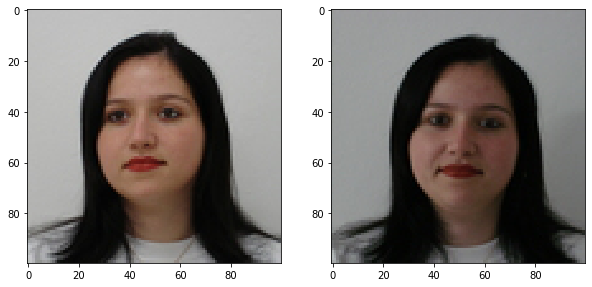

ACERTOU
min_norm_difference = 13315.577268748058
class = 27


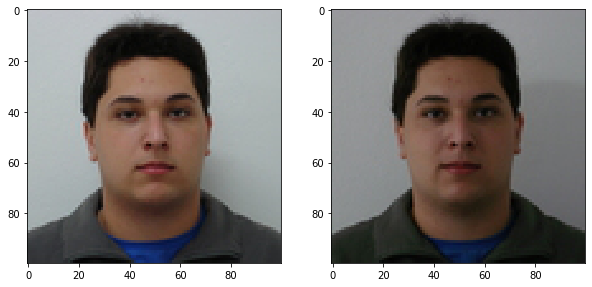

ACERTOU
min_norm_difference = 12035.19555304358
class = 26


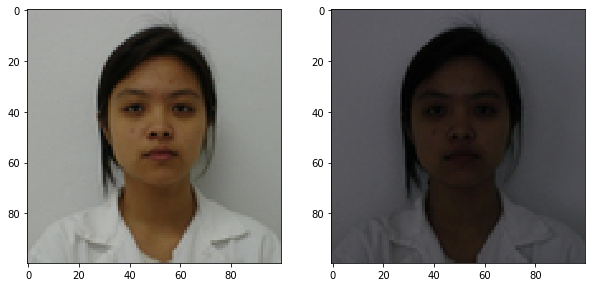

ACERTOU
min_norm_difference = 11562.547945846538
class = 25


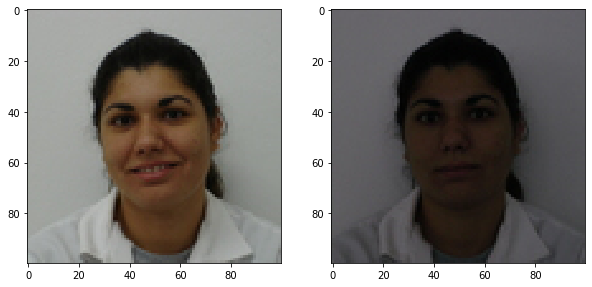

ACERTOU
min_norm_difference = 12978.317726115354
class = 24


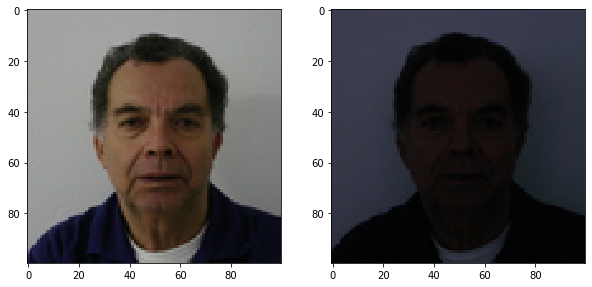

ERROU 23 =/= 38
min_norm_difference = 14587.197743226765
class = 38


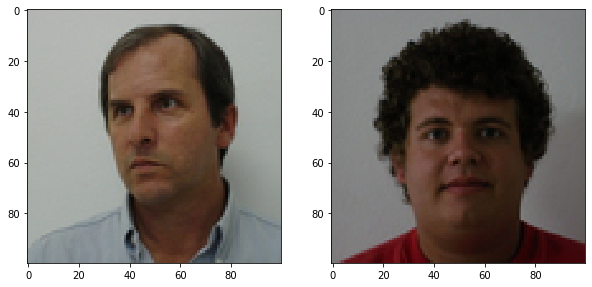

ACERTOU
min_norm_difference = 13028.570911654126
class = 22


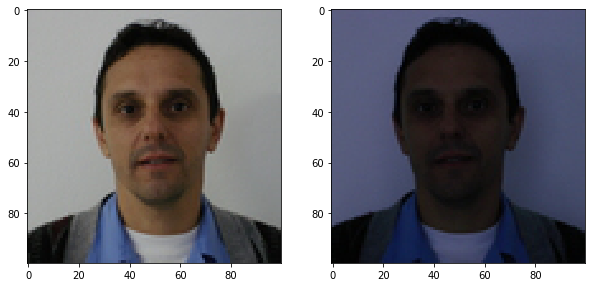

ACERTOU
min_norm_difference = 15271.006581100017
class = 21


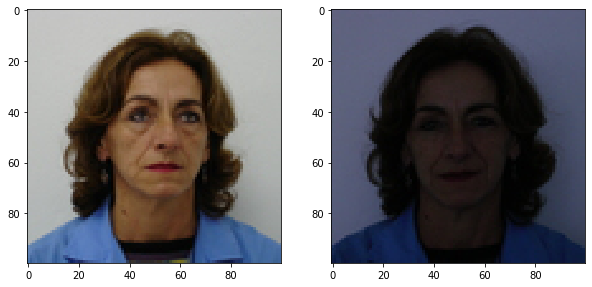

ERROU 20 =/= 33
min_norm_difference = 12728.148412082568
class = 33


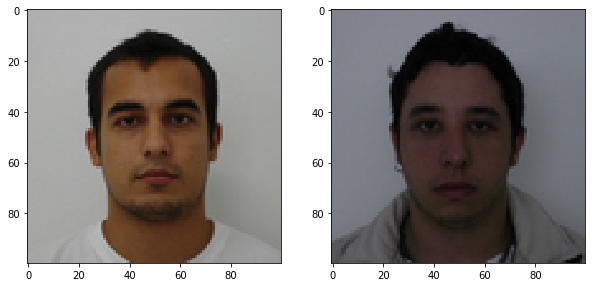

ERROU 19 =/= 14
min_norm_difference = 16793.2314936703
class = 14


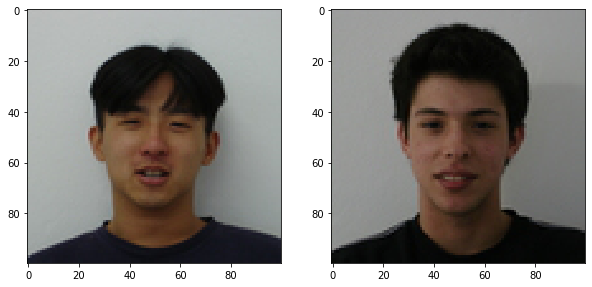

ERROU 18 =/= 33
min_norm_difference = 12777.745027977355
class = 33


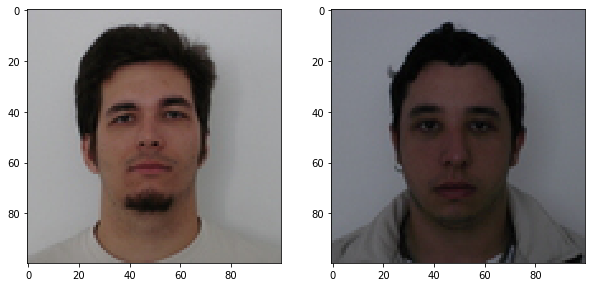

ERROU 17 =/= 47
min_norm_difference = 13045.00410118755
class = 47


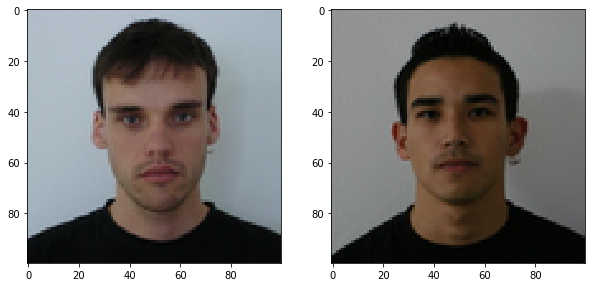

ERROU 16 =/= 25
min_norm_difference = 13177.542297408876
class = 25


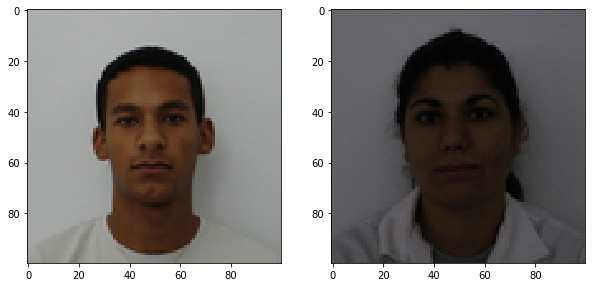

ERROU 15 =/= 47
min_norm_difference = 13147.105422867804
class = 47


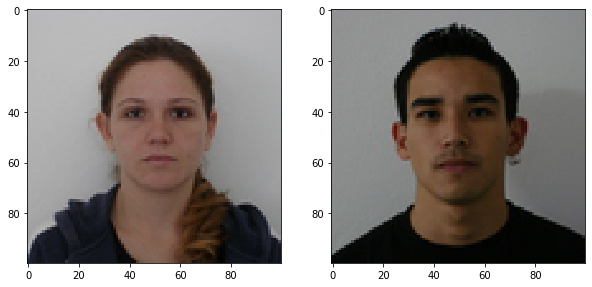

ACERTOU
min_norm_difference = 12859.289132763133
class = 14


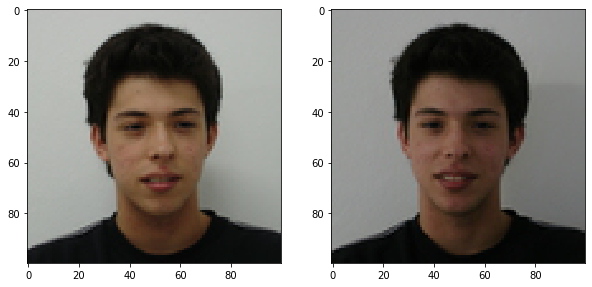

ERROU 13 =/= 37
min_norm_difference = 9299.254486247808
class = 37


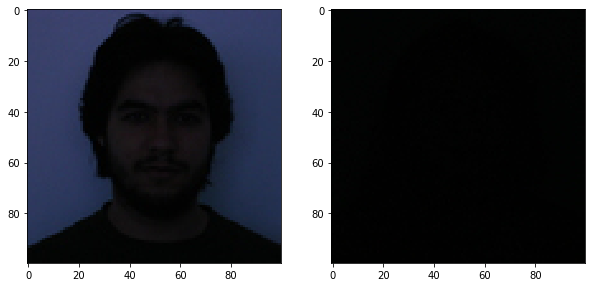

ERROU 12 =/= 1
min_norm_difference = 14437.778672635206
class = 1


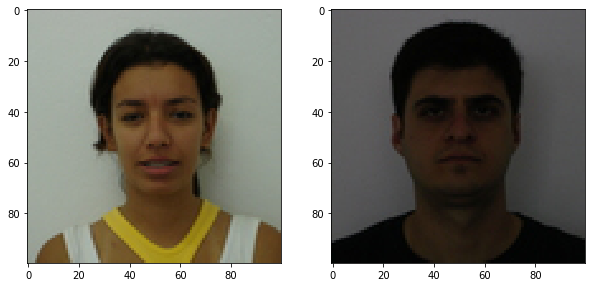

ERROU 11 =/= 37
min_norm_difference = 16221.469569678327
class = 37


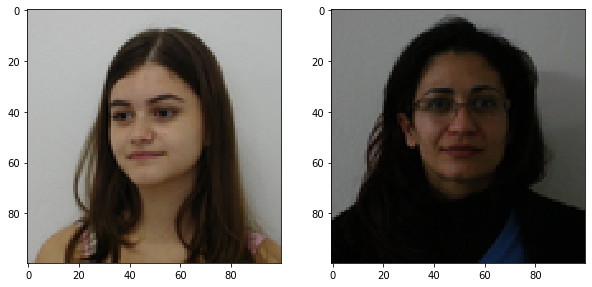

ERROU 10 =/= 13
min_norm_difference = 15811.538192092508
class = 13


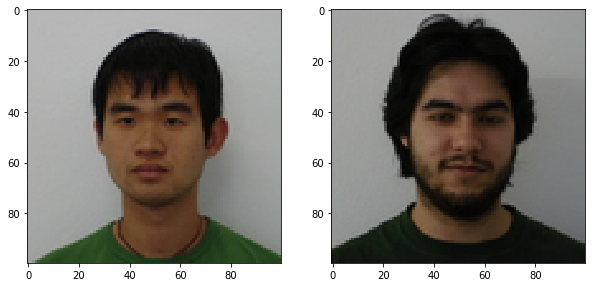

ERROU 9 =/= 33
min_norm_difference = 13476.737290605615
class = 33


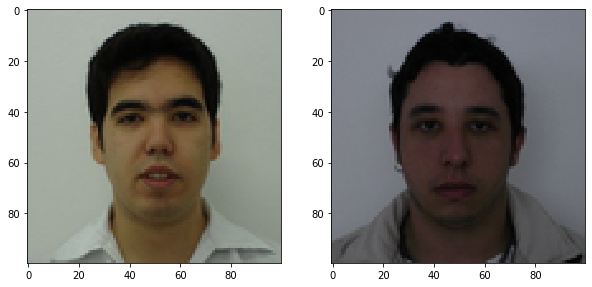

ACERTOU
min_norm_difference = 10636.214458161325
class = 8


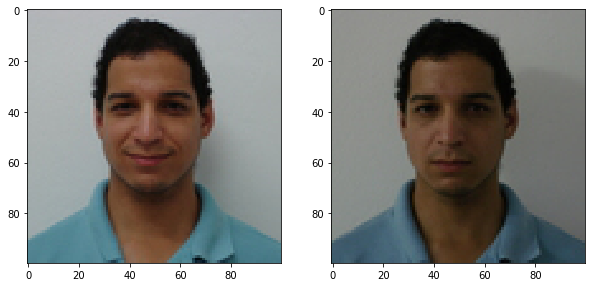

ACERTOU
min_norm_difference = 13506.207572816287
class = 7


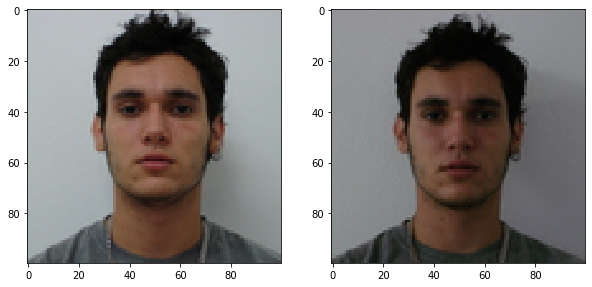

ACERTOU
min_norm_difference = 12055.549842292554
class = 6


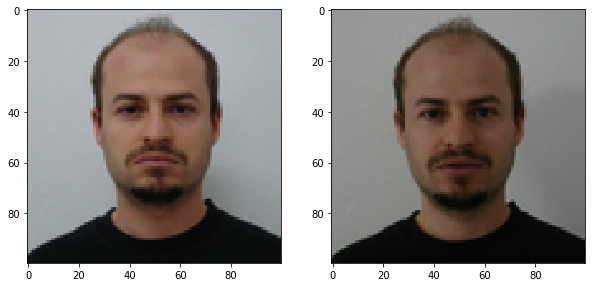

ERROU 5 =/= 27
min_norm_difference = 7626.129686807063
class = 27


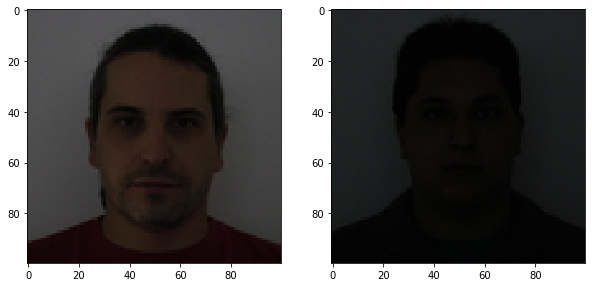

ACERTOU
min_norm_difference = 13787.295782712432
class = 4


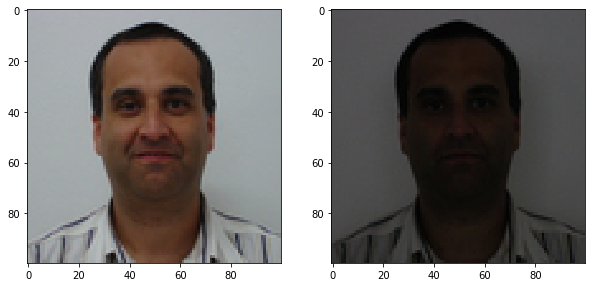

ACERTOU
min_norm_difference = 13196.212373253167
class = 3


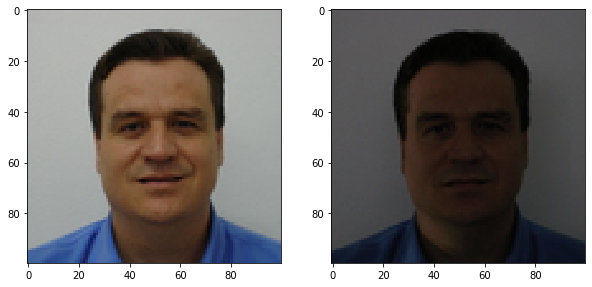

ACERTOU
min_norm_difference = 11583.991885356274
class = 2


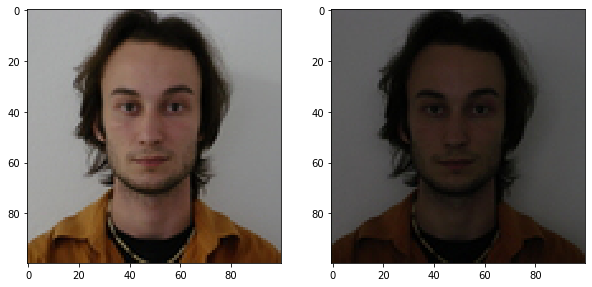

ACERTOU
min_norm_difference = 12665.43201000266
class = 1


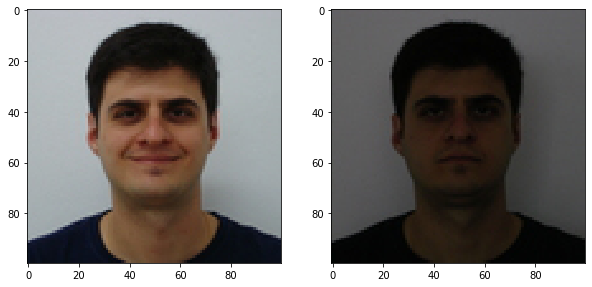

40.0% de acerto


In [9]:
load('recdev/medium/', {'1': [], '2': [], '3': [], '4': [], '5': [], '6': [], '7': [], '8': [], '9': [], '10': [],
                        '11': [], '12': [], '13': [], '14': [], '15': [], '16': [], '17': [], '18': [], '19': [], '20': [],
                        '21': [], '22': [], '23': [], '24': [], '25': [], '26': [], '27': [], '28': [], '29': [], '30': [],
                        '31': [], '32': [], '33': [], '34': [], '35': [], '36': [], '37': [], '38': [], '39': [], '40': [],
                        '41': [], '42': [], '43': [], '44': [], '45': [], '46': [], '47': [], '48': [], '49': [], '50': [],
                       }, 7)
percent = recognize(True,False)
print(str(percent) + "% de acerto")

## MEDIUM COM PCA

ERROU 50 =/= 1
min_norm_difference = 2772.970013831139
class = 1


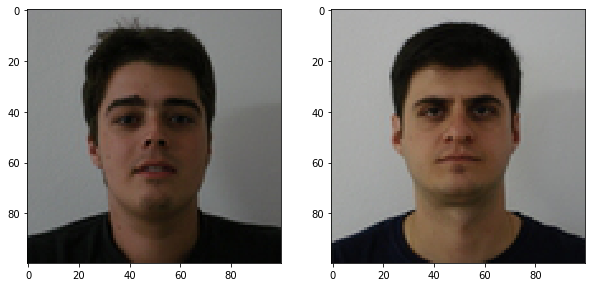

ACERTOU
min_norm_difference = 1697.2071800740698
class = 49


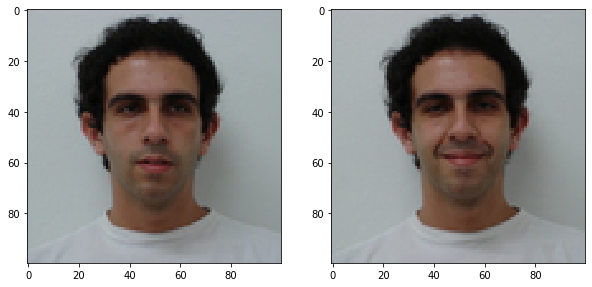

ACERTOU
min_norm_difference = 1768.7486830732983
class = 48


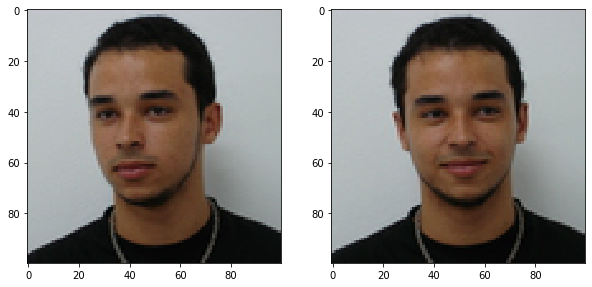

ERROU 47 =/= 49
min_norm_difference = 1188.005969890631
class = 49


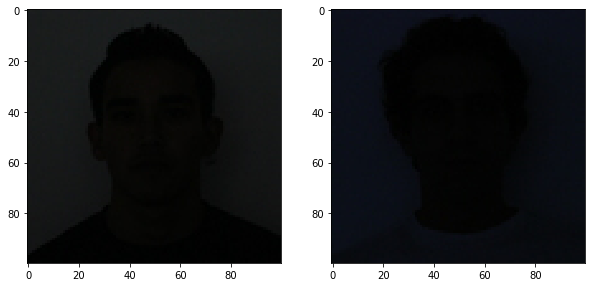

ERROU 46 =/= 48
min_norm_difference = 1148.1926471234367
class = 48


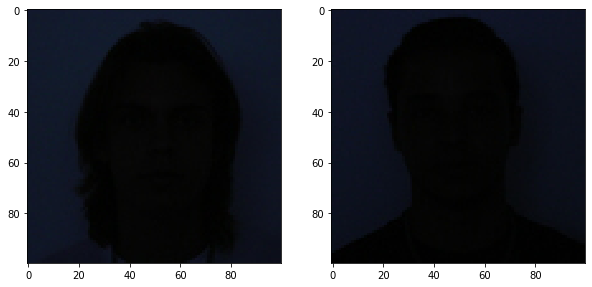

ACERTOU
min_norm_difference = 1133.9769255080614
class = 45


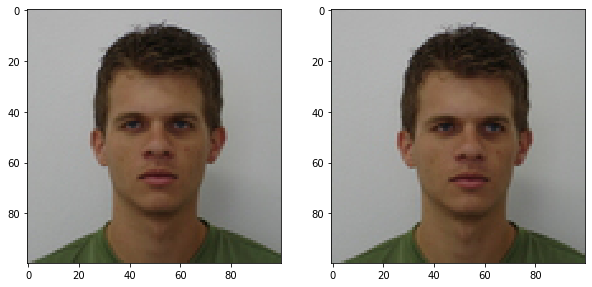

ACERTOU
min_norm_difference = 1227.0328140003364
class = 44


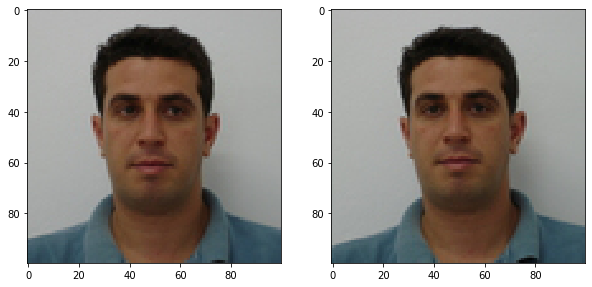

ACERTOU
min_norm_difference = 730.0601222541179
class = 43


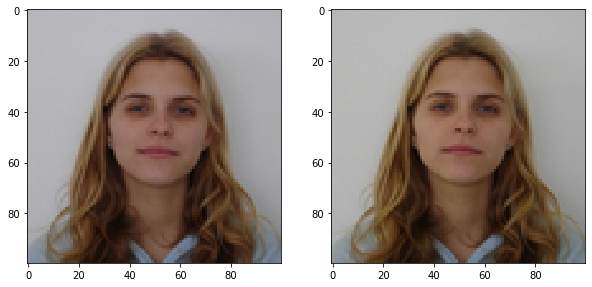

ERROU 42 =/= 46
min_norm_difference = 5278.095467219441
class = 46


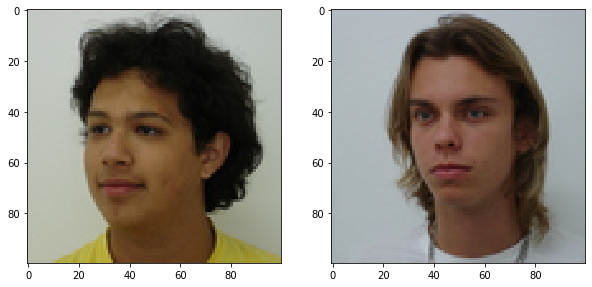

ACERTOU
min_norm_difference = 2711.6688385740904
class = 41


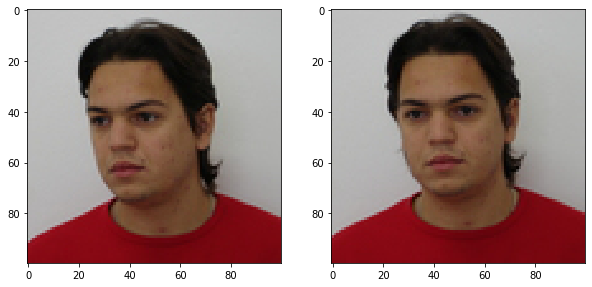

ACERTOU
min_norm_difference = 2279.0424773542222
class = 40


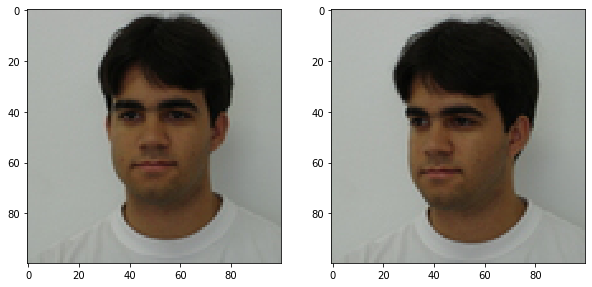

ACERTOU
min_norm_difference = 2272.427901823407
class = 39


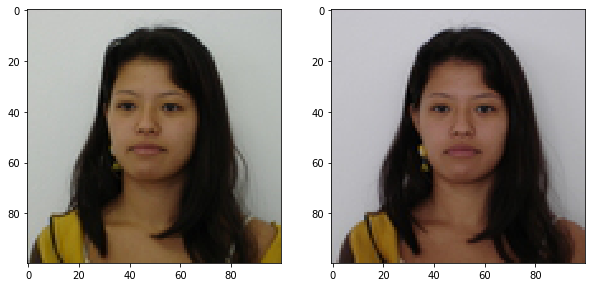

ACERTOU
min_norm_difference = 2631.638771203964
class = 38


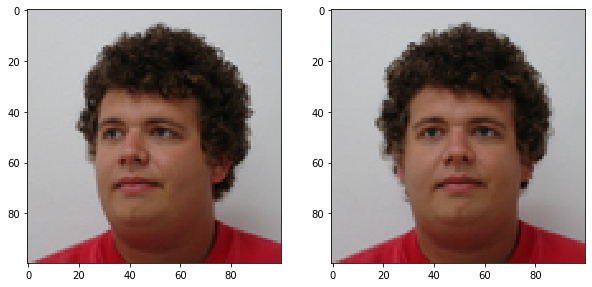

ACERTOU
min_norm_difference = 2664.955514935676
class = 37


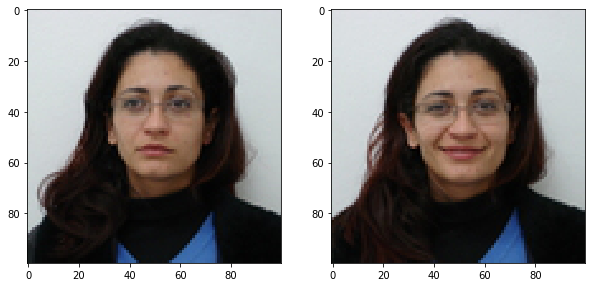

ACERTOU
min_norm_difference = 3324.0289277774173
class = 36


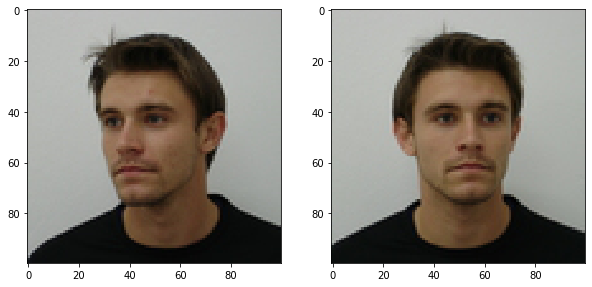

ACERTOU
min_norm_difference = 1809.0966314227444
class = 35


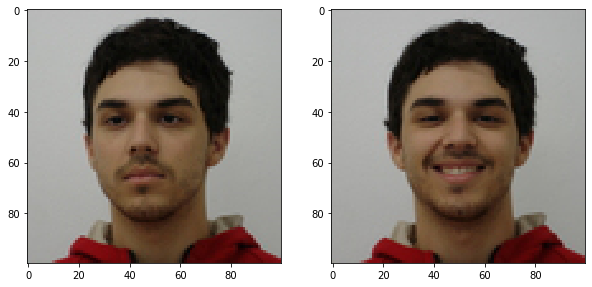

ACERTOU
min_norm_difference = 736.5698403546132
class = 34


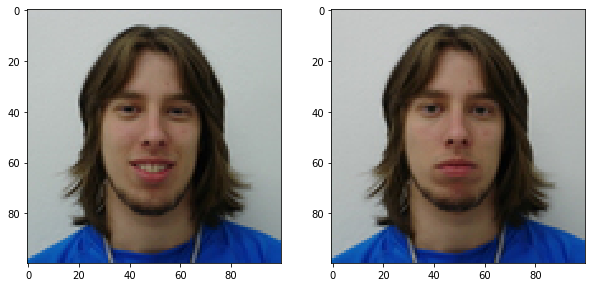

ACERTOU
min_norm_difference = 1662.839078260669
class = 33


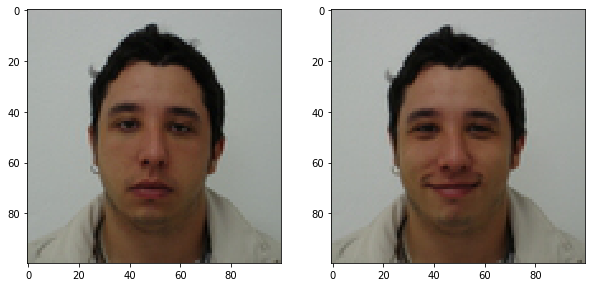

ACERTOU
min_norm_difference = 1276.4666975303146
class = 32


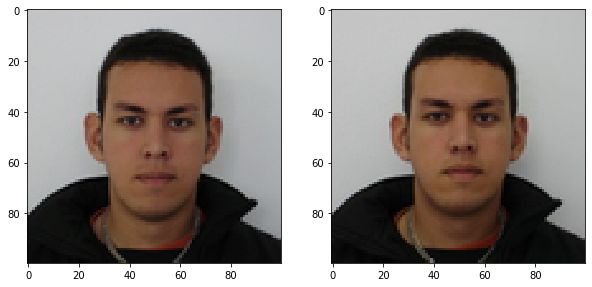

ACERTOU
min_norm_difference = 1034.4644855485499
class = 31


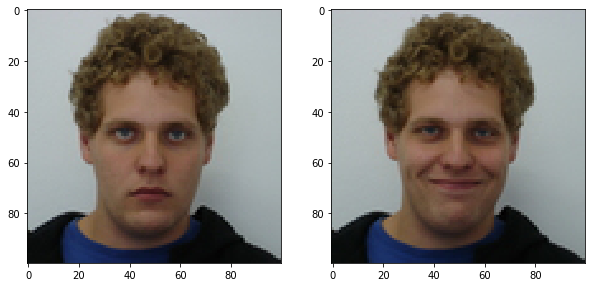

ACERTOU
min_norm_difference = 926.9416558698437
class = 30


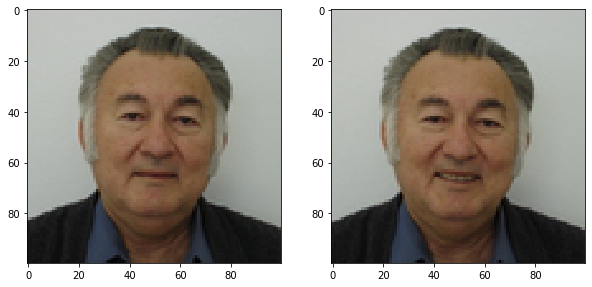

ACERTOU
min_norm_difference = 1535.6333064226749
class = 29


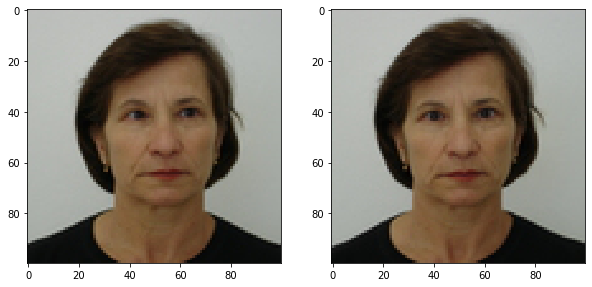

ACERTOU
min_norm_difference = 4166.087149895111
class = 28


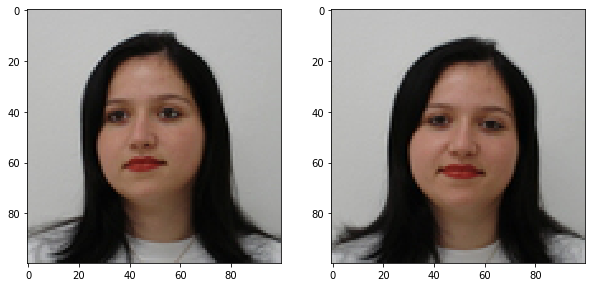

ERROU 27 =/= 48
min_norm_difference = 791.4461400680972
class = 48


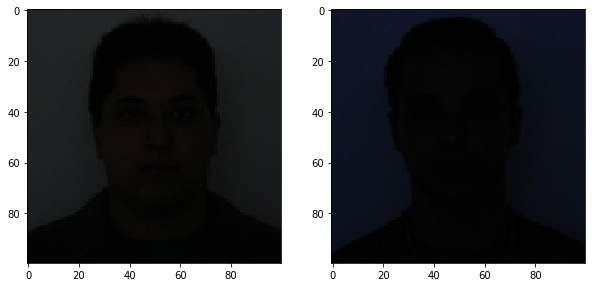

ERROU 26 =/= 25
min_norm_difference = 3445.74594688532
class = 25


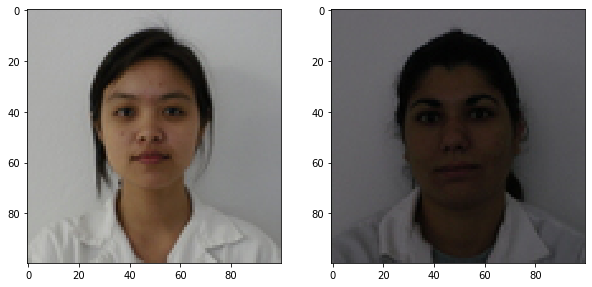

ACERTOU
min_norm_difference = 4573.207343009052
class = 25


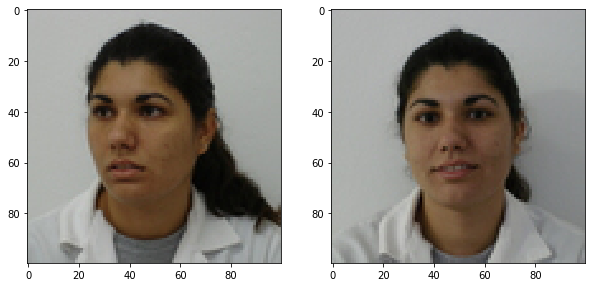

ACERTOU
min_norm_difference = 1829.1138055916822
class = 24


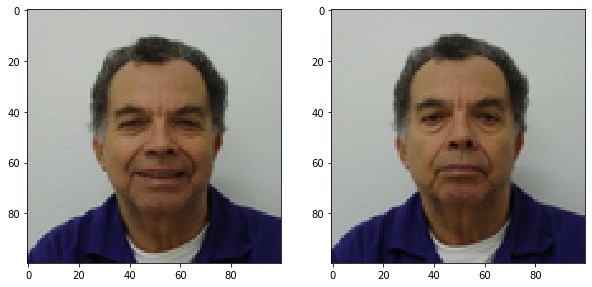

ACERTOU
min_norm_difference = 1105.9180620277186
class = 23


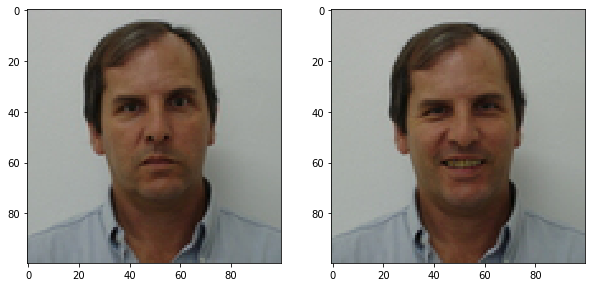

ACERTOU
min_norm_difference = 1798.7420211000576
class = 22


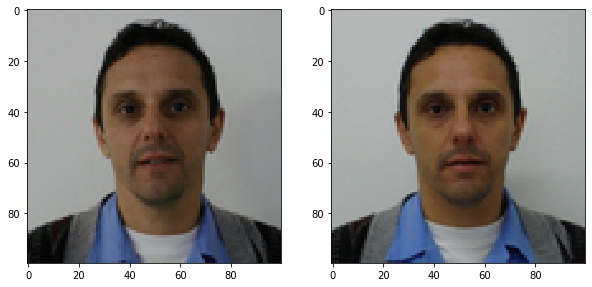

ACERTOU
min_norm_difference = 3071.9906266644825
class = 21


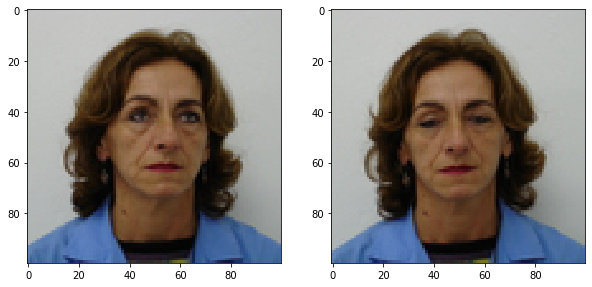

ERROU 20 =/= 25
min_norm_difference = 2128.1595472393938
class = 25


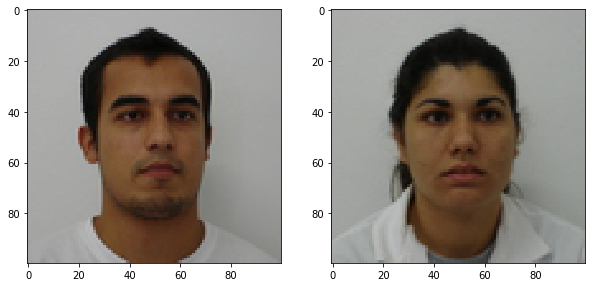

ACERTOU
min_norm_difference = 2954.8166279167913
class = 19


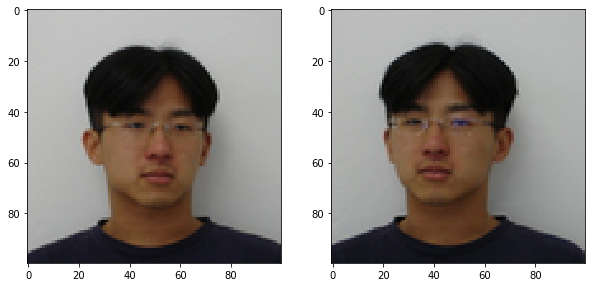

ERROU 18 =/= 9
min_norm_difference = 2933.342885813929
class = 9


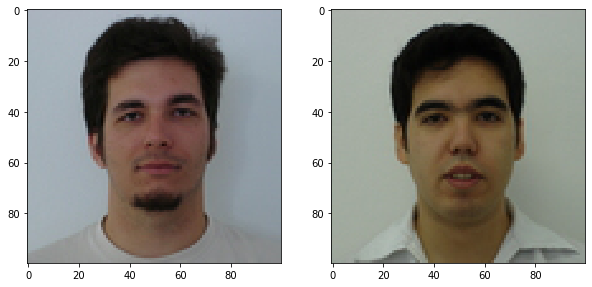

ACERTOU
min_norm_difference = 952.9224716143761
class = 17


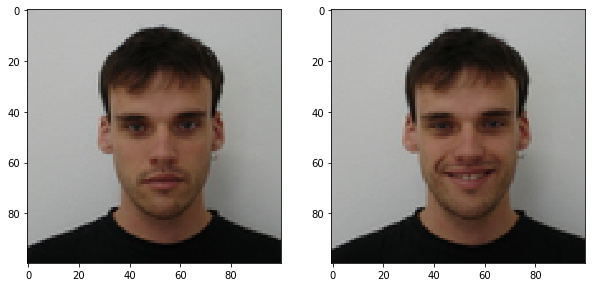

ACERTOU
min_norm_difference = 1373.6726319828026
class = 16


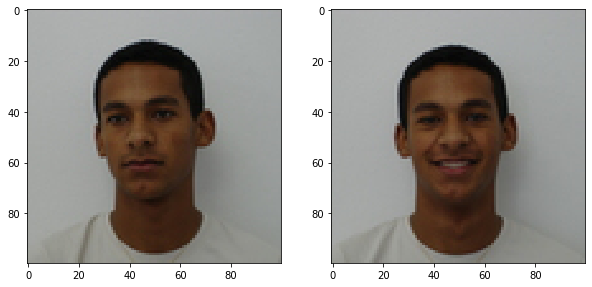

ACERTOU
min_norm_difference = 2125.397667914095
class = 15


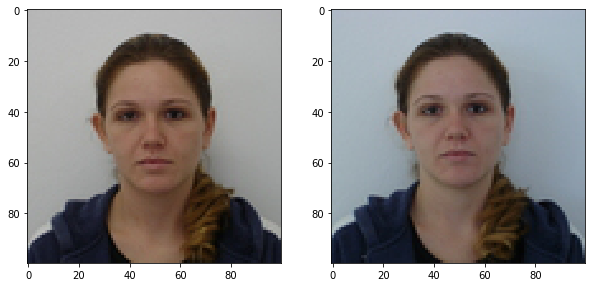

ACERTOU
min_norm_difference = 2339.713452216537
class = 14


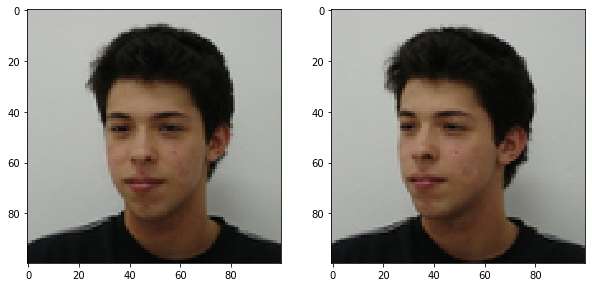

ACERTOU
min_norm_difference = 2362.654153695818
class = 13


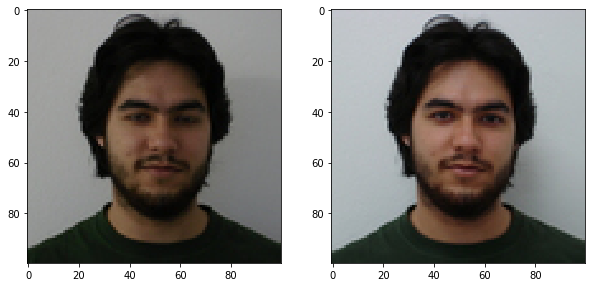

ACERTOU
min_norm_difference = 1605.3126155015927
class = 12


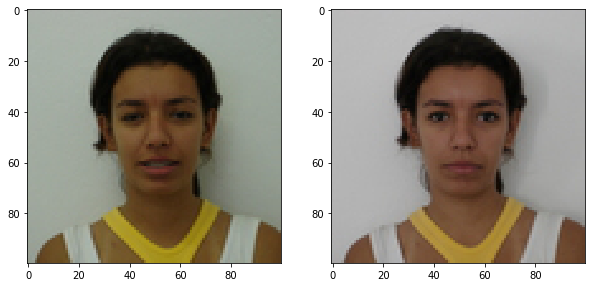

ACERTOU
min_norm_difference = 992.9761047761476
class = 11


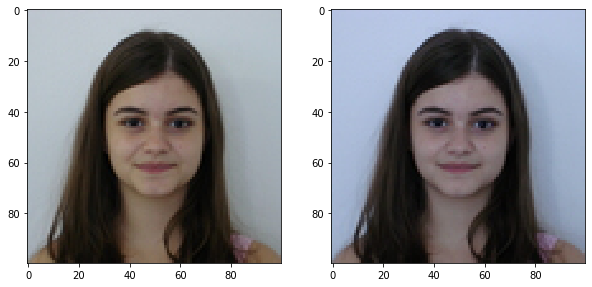

ACERTOU
min_norm_difference = 689.4045175325379
class = 10


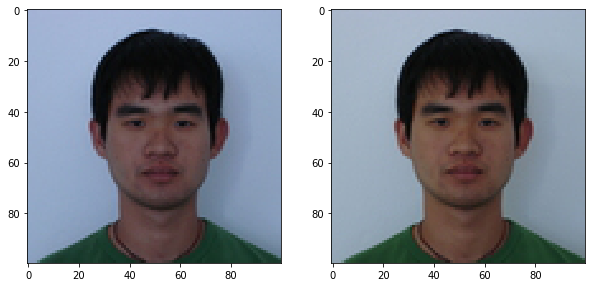

ACERTOU
min_norm_difference = 1642.344983904049
class = 9


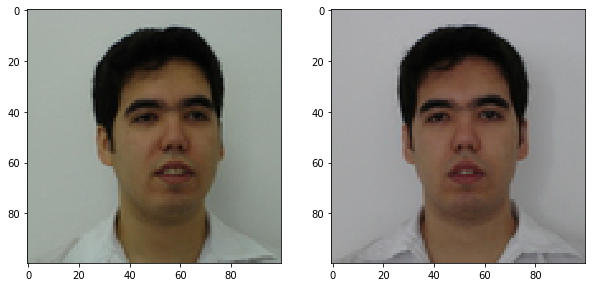

ACERTOU
min_norm_difference = 1839.3416262978087
class = 8


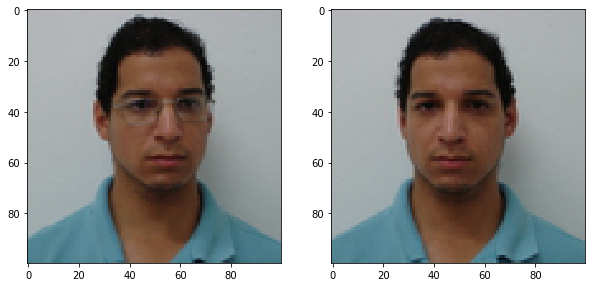

ACERTOU
min_norm_difference = 1281.7371769800668
class = 7


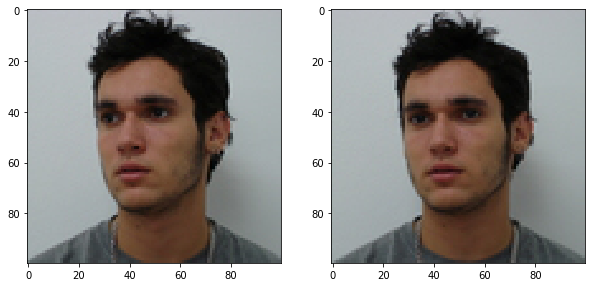

ERROU 6 =/= 5
min_norm_difference = 1493.6599851494354
class = 5


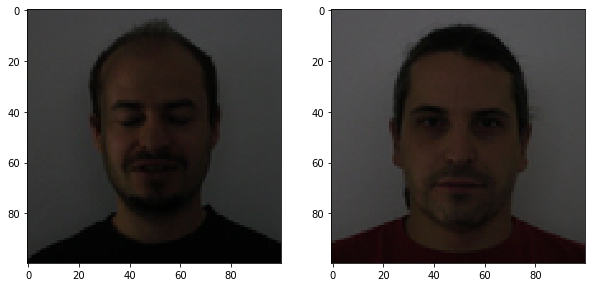

ACERTOU
min_norm_difference = 1468.1383826078234
class = 5


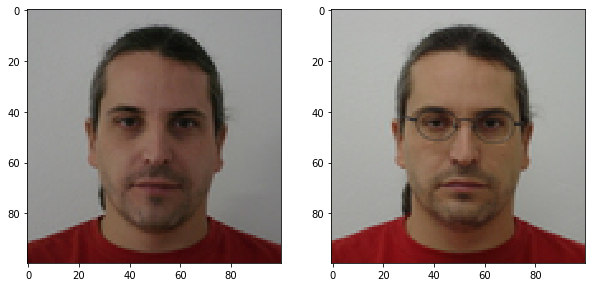

ERROU 4 =/= 25
min_norm_difference = 2341.958052000313
class = 25


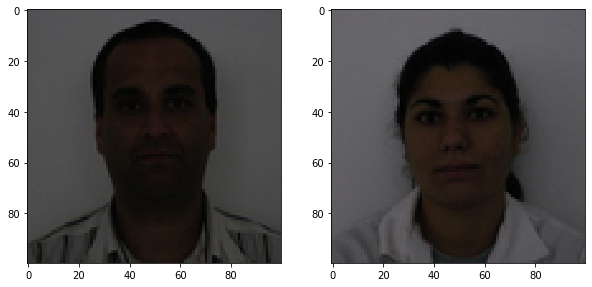

ERROU 3 =/= 5
min_norm_difference = 1535.5158503837833
class = 5


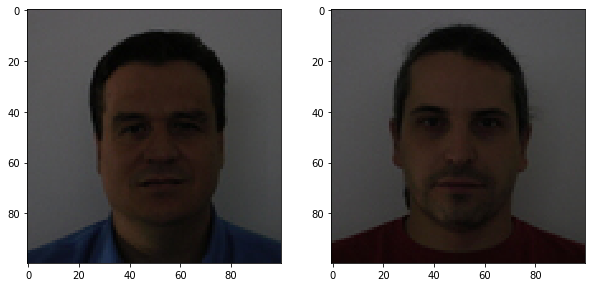

ACERTOU
min_norm_difference = 2416.977662136796
class = 2


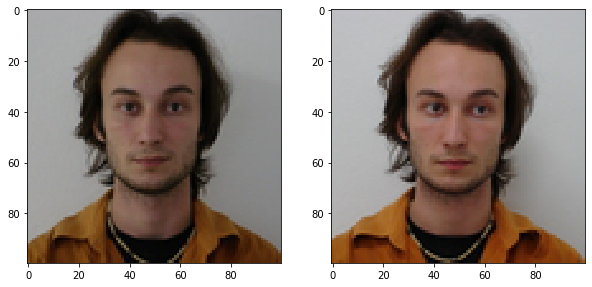

ACERTOU
min_norm_difference = 1573.864786689396
class = 1


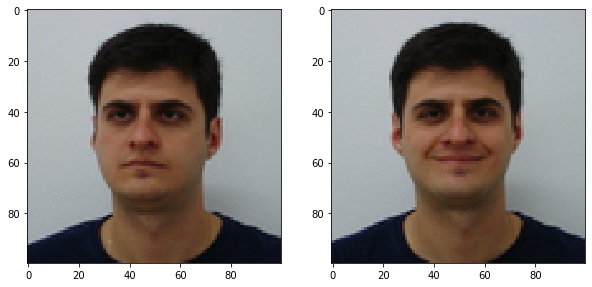

78.0% de acerto


In [11]:
load('recdev/medium/', {'1': [], '2': [], '3': [], '4': [], '5': [], '6': [], '7': [], '8': [], '9': [], '10': [],
                        '11': [], '12': [], '13': [], '14': [], '15': [], '16': [], '17': [], '18': [], '19': [], '20': [],
                        '21': [], '22': [], '23': [], '24': [], '25': [], '26': [], '27': [], '28': [], '29': [], '30': [],
                        '31': [], '32': [], '33': [], '34': [], '35': [], '36': [], '37': [], '38': [], '39': [], '40': [],
                        '41': [], '42': [], '43': [], '44': [], '45': [], '46': [], '47': [], '48': [], '49': [], '50': [],
                       }, 7)
percent = recognize(True,True)
print(str(percent) + "% de acerto")

## EXTRAS COM FORÇA BRUTA

ERROU 5 =/= 3
min_norm_difference = 13975.544425889104
class = 3


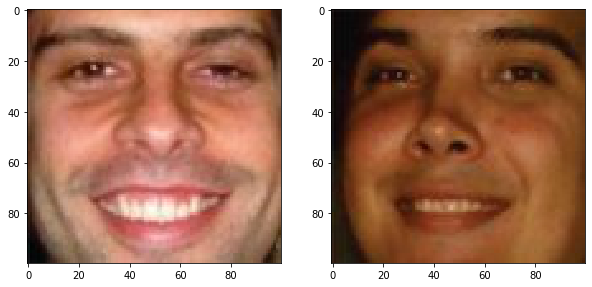

ERROU 4 =/= 3
min_norm_difference = 15376.654772739095
class = 3


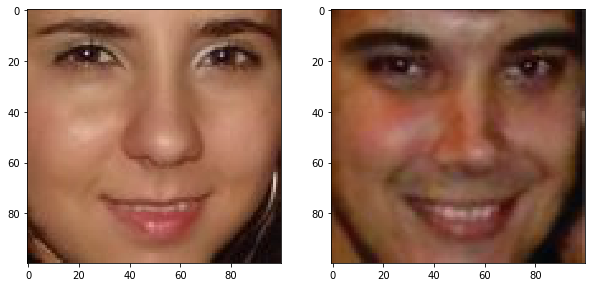

ACERTOU
min_norm_difference = 17457.04138736
class = 3


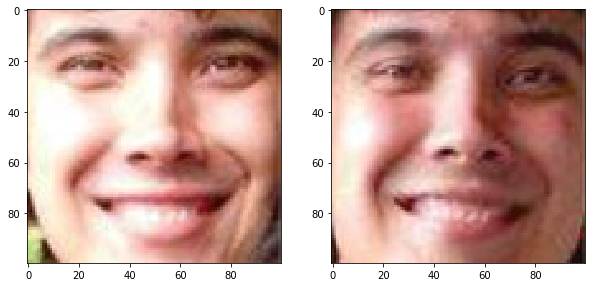

ERROU 2 =/= 4
min_norm_difference = 19451.738405602722
class = 4


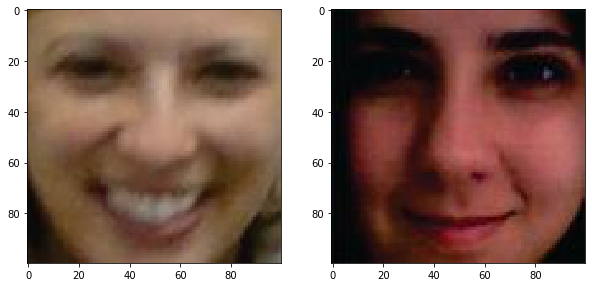

ACERTOU
min_norm_difference = 12002.786426492808
class = 1


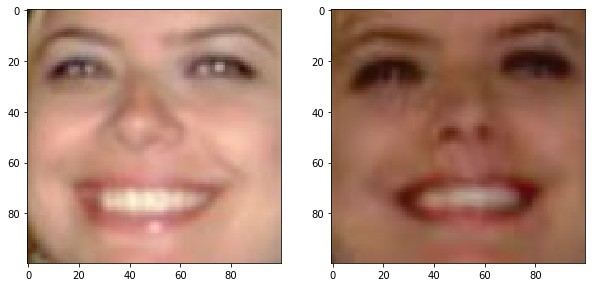

ERROU 5 =/= 4
min_norm_difference = 20588.836805414725
class = 4


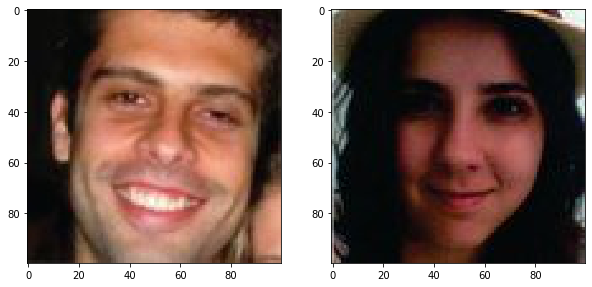

ACERTOU
min_norm_difference = 19681.146028623436
class = 4


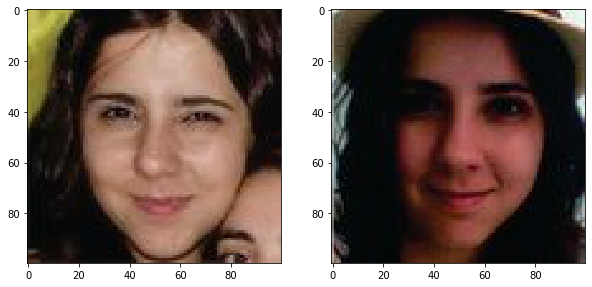

ERROU 3 =/= 4
min_norm_difference = 20461.522866101634
class = 4


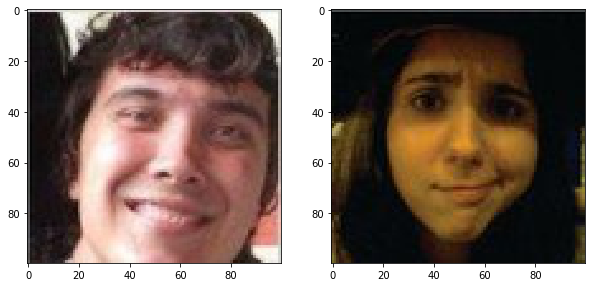

ACERTOU
min_norm_difference = 16974.776758473145
class = 2


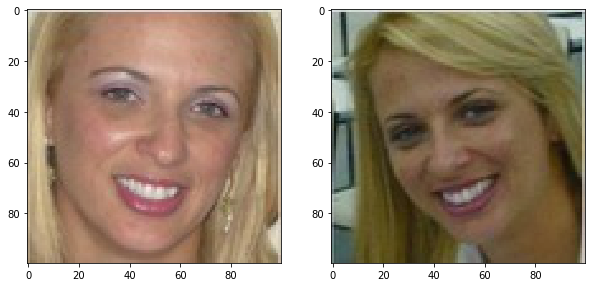

ERROU 1 =/= 5
min_norm_difference = 18725.934769725114
class = 5


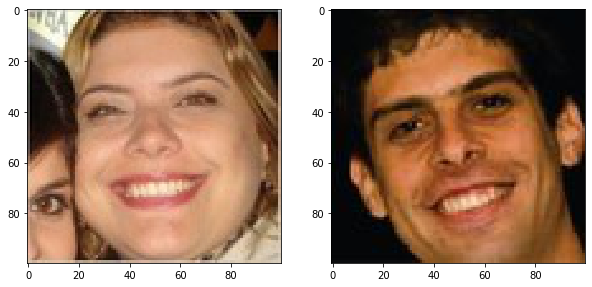

ERROU 5 =/= 2
min_norm_difference = 31.500078
class = 2


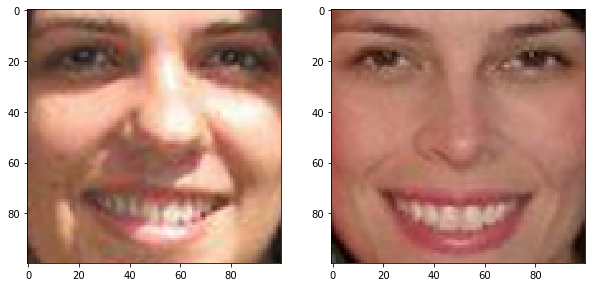

ACERTOU
min_norm_difference = 10.884112
class = 4


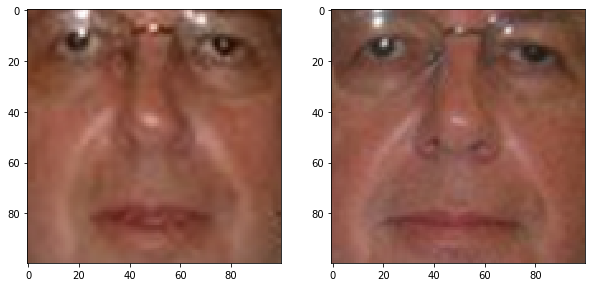

ERROU 3 =/= 1
min_norm_difference = 15.997838
class = 1


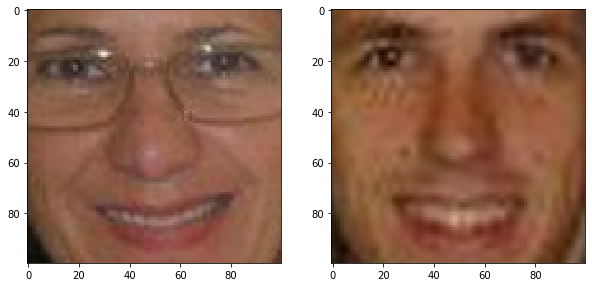

ACERTOU
min_norm_difference = 14.596445
class = 2


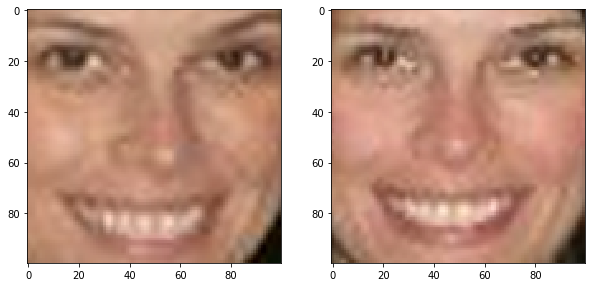

ACERTOU
min_norm_difference = 14.472423
class = 1


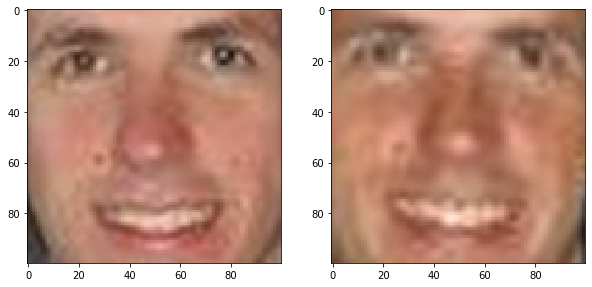

ERROU 5 =/= 3
min_norm_difference = 37.65171
class = 3


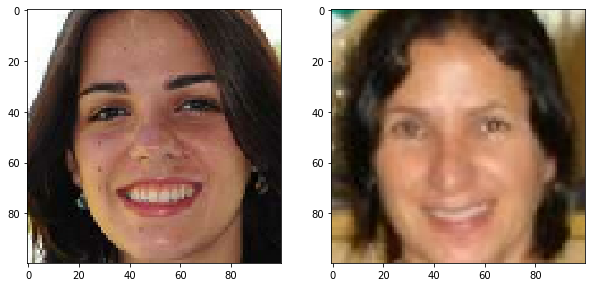

ACERTOU
min_norm_difference = 34.679886
class = 4


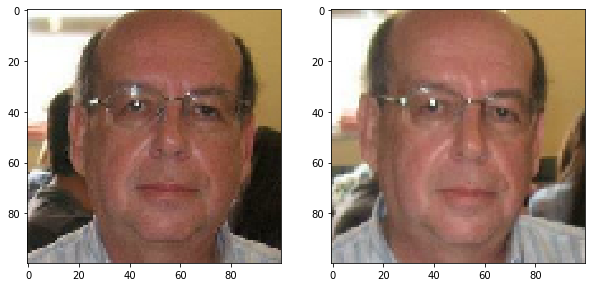

ACERTOU
min_norm_difference = 22.141226
class = 3


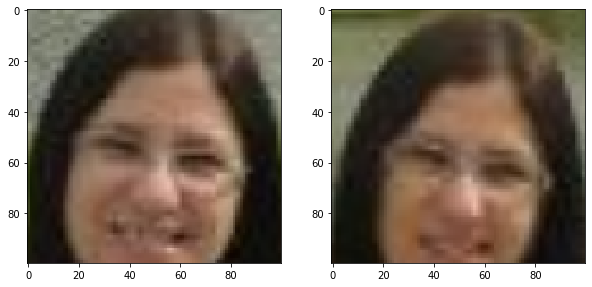

ERROU 2 =/= 1
min_norm_difference = 26.4481
class = 1


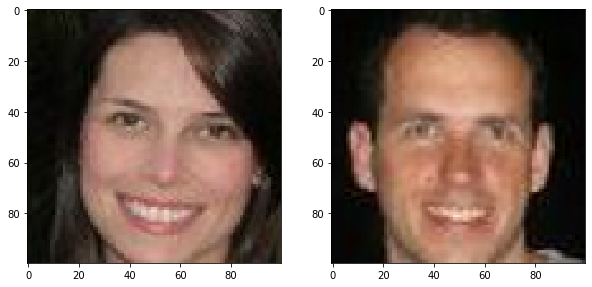

ERROU 1 =/= 4
min_norm_difference = 43.865707
class = 4


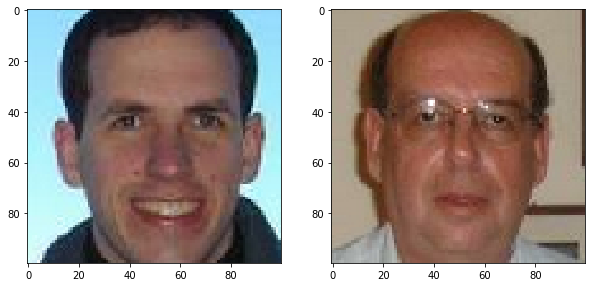

45.0% de acerto



In [12]:
percent_sum = 0

load('recdev/extras/facebookfaces/crop-inner/', {'1': [], '2': [], '3': [], '4': [], '5': []}, 9)
percent = recognize(True,False)
percent_sum = percent_sum + percent

load('recdev/extras/facebookfaces/crop-outer/', {'1': [], '2': [], '3': [], '4': [], '5': []}, 9)
percent = recognize(True,False)
percent_sum = percent_sum + percent

load('recdev/extras/facebookfaces-2/crop-inner/', {'1': [], '2': [], '3': [], '4': [], '5': []}, 10, ".png")
percent = recognize(True,False)
percent_sum = percent_sum + percent

load('recdev/extras/facebookfaces-2/crop-outer/', {'1': [], '2': [], '3': [], '4': [], '5': []}, 10, ".png")
percent = recognize(True,False)
percent_sum = percent_sum + percent

print(str(percent_sum/4.) + "% de acerto\n")

## EXTRAS COM PCA

ACERTOU
min_norm_difference = 3253.6583752409947
class = 5


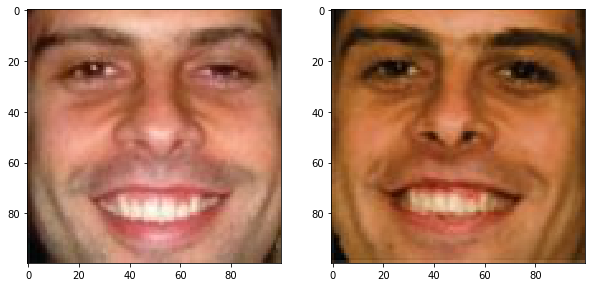

ACERTOU
min_norm_difference = 2557.746611783357
class = 4


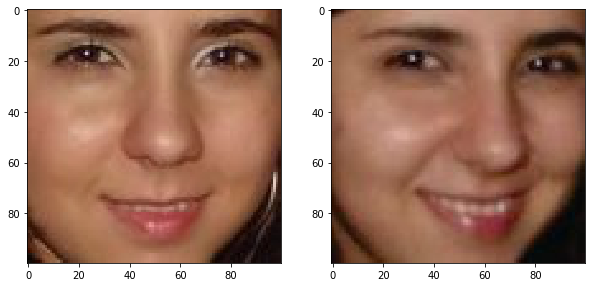

ERROU 3 =/= 1
min_norm_difference = 2874.1541405100165
class = 1


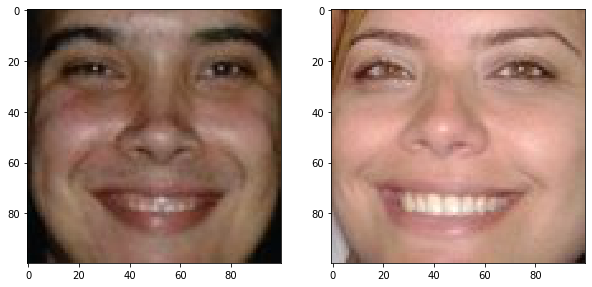

ERROU 2 =/= 3
min_norm_difference = 2666.900961067539
class = 3


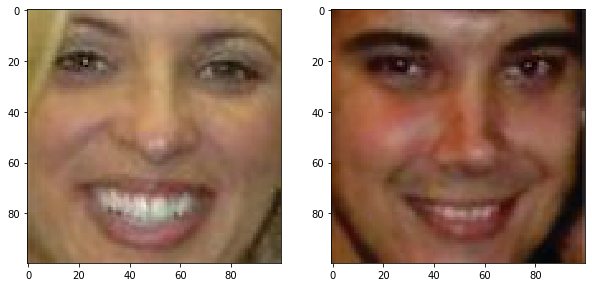

ERROU 1 =/= 3
min_norm_difference = 3363.4101454817974
class = 3


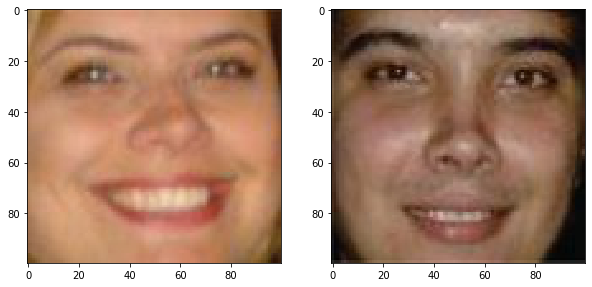

ERROU 5 =/= 1
min_norm_difference = 7331.616024403521
class = 1


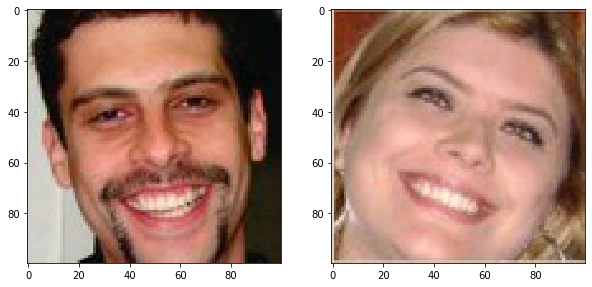

ERROU 4 =/= 1
min_norm_difference = 7621.637296445461
class = 1


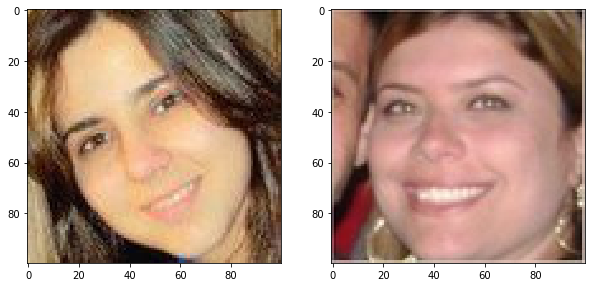

ERROU 3 =/= 2
min_norm_difference = 5078.481725310591
class = 2


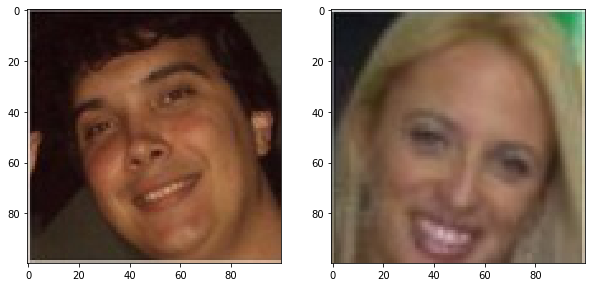

ERROU 2 =/= 5
min_norm_difference = 4310.415359039021
class = 5


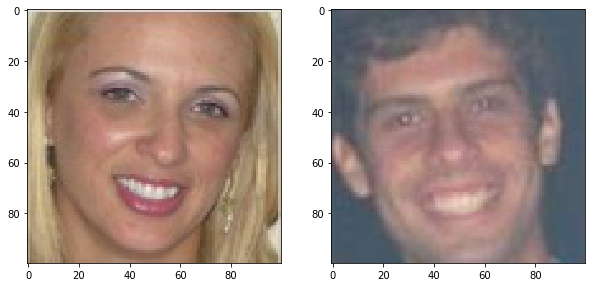

ERROU 1 =/= 2
min_norm_difference = 4673.645137394992
class = 2


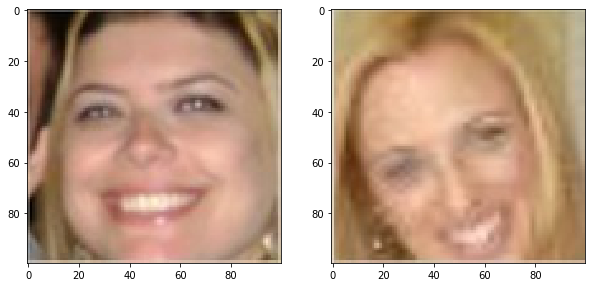

ERROU 5 =/= 2
min_norm_difference = 16.02081
class = 2


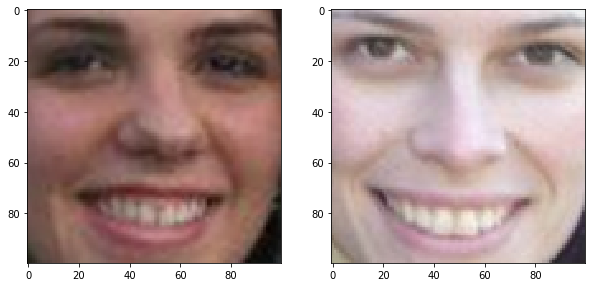

ACERTOU
min_norm_difference = 4.0746694
class = 4


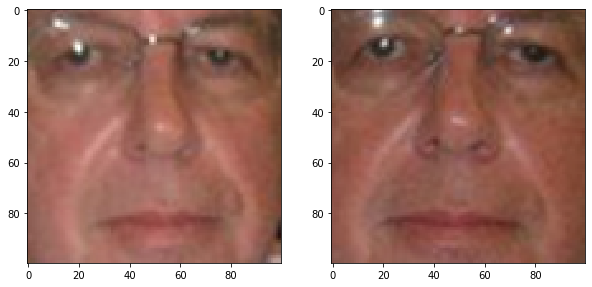

ERROU 3 =/= 5
min_norm_difference = 9.069547
class = 5


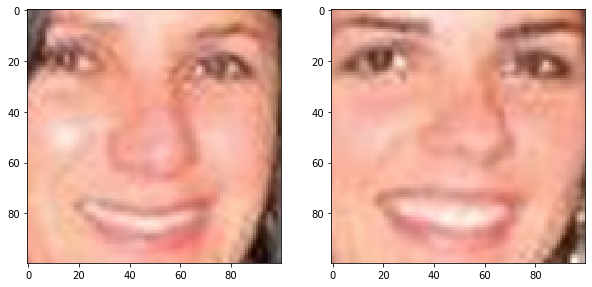

ACERTOU
min_norm_difference = 13.229839
class = 2


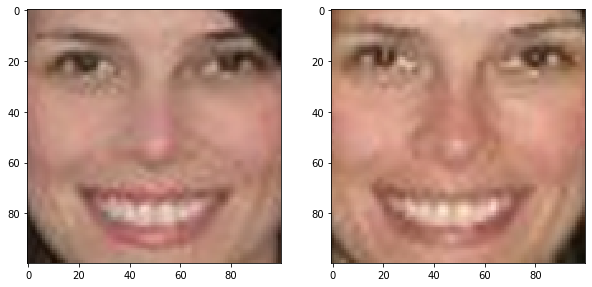

ERROU 1 =/= 4
min_norm_difference = 7.6844873
class = 4


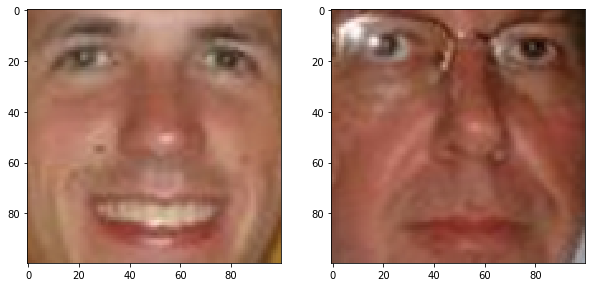

ERROU 5 =/= 4
min_norm_difference = 18.455128
class = 4


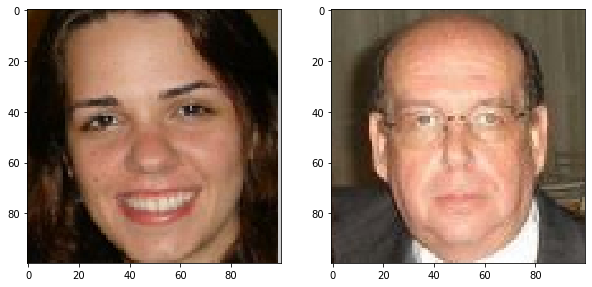

ACERTOU
min_norm_difference = 23.21138
class = 4


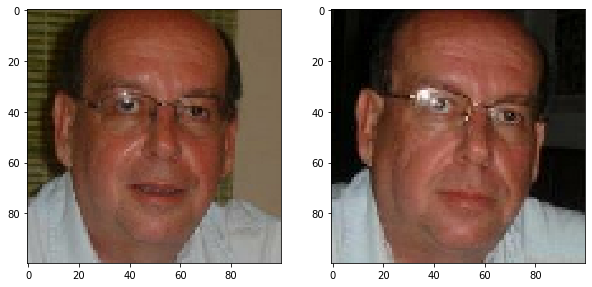

ERROU 3 =/= 2
min_norm_difference = 20.764988
class = 2


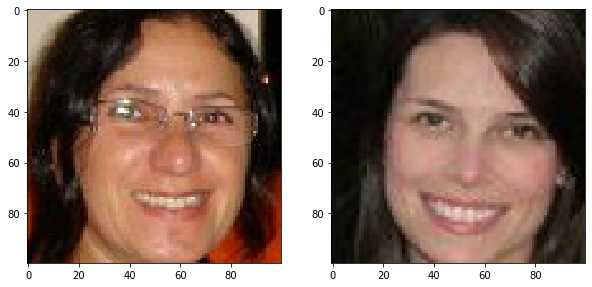

ACERTOU
min_norm_difference = 22.065767
class = 2


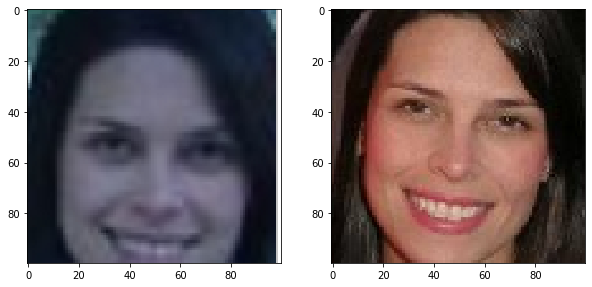

ERROU 1 =/= 4
min_norm_difference = 21.247051
class = 4


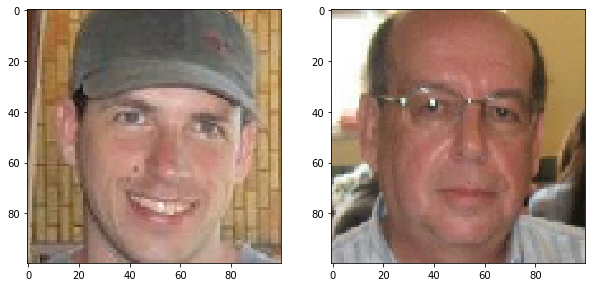

30.0% de acerto



In [13]:
percent_sum = 0

load('recdev/extras/facebookfaces/crop-inner/', {'1': [], '2': [], '3': [], '4': [], '5': []}, 9)
percent = recognize(True,True)
percent_sum = percent_sum + percent

load('recdev/extras/facebookfaces/crop-outer/', {'1': [], '2': [], '3': [], '4': [], '5': []}, 9)
percent = recognize(True,True)
percent_sum = percent_sum + percent

load('recdev/extras/facebookfaces-2/crop-inner/', {'1': [], '2': [], '3': [], '4': [], '5': []}, 10, ".png")
percent = recognize(True,True)
percent_sum = percent_sum + percent

load('recdev/extras/facebookfaces-2/crop-outer/', {'1': [], '2': [], '3': [], '4': [], '5': []}, 10, ".png")
percent = recognize(True,True)
percent_sum = percent_sum + percent

print(str(percent_sum/4.) + "% de acerto\n")

# Taxas de acerto

In [14]:
print("VERY-EASY 3 TIMES")
print("BRUTE FORCE: " + str(test(3, False, 'recdev/very-easy/', {'2': [], '11': [], '15': [], '16': [], '87': []}, 2)) + "%")
print("PCA: " + str(test(3, True, 'recdev/very-easy/', {'2': [], '11': [], '15': [], '16': [], '87': []}, 2)) + "%")

print("\nEASY 3 TIMES")
print("BRUTE FORCE: " + str(test(3, False, 'recdev/easy/', {'2': [], '11': [], '15': [], '16': [], '87': []}, 8)) + "%")
print("PCA: " + str(test(3, True, 'recdev/easy/', {'2': [], '11': [], '15': [], '16': [], '87': []}, 8)) + "%")

print("\nMEDIUM 1 TIME")
print("BRUTE FORCE: " + str(test(1, False, 'recdev/medium/', {'1': [], '2': [], '3': [], '4': [], '5': [], '6': [], '7': [], '8': [], '9': [], '10': [],
                        '11': [], '12': [], '13': [], '14': [], '15': [], '16': [], '17': [], '18': [], '19': [], '20': [],
                        '21': [], '22': [], '23': [], '24': [], '25': [], '26': [], '27': [], '28': [], '29': [], '30': [],
                        '31': [], '32': [], '33': [], '34': [], '35': [], '36': [], '37': [], '38': [], '39': [], '40': [],
                        '41': [], '42': [], '43': [], '44': [], '45': [], '46': [], '47': [], '48': [], '49': [], '50': [],
                       }, 7)) + "%")
print("PCA: " + str(test(1, True, 'recdev/medium/', {'1': [], '2': [], '3': [], '4': [], '5': [], '6': [], '7': [], '8': [], '9': [], '10': [],
                        '11': [], '12': [], '13': [], '14': [], '15': [], '16': [], '17': [], '18': [], '19': [], '20': [],
                        '21': [], '22': [], '23': [], '24': [], '25': [], '26': [], '27': [], '28': [], '29': [], '30': [],
                        '31': [], '32': [], '33': [], '34': [], '35': [], '36': [], '37': [], '38': [], '39': [], '40': [],
                        '41': [], '42': [], '43': [], '44': [], '45': [], '46': [], '47': [], '48': [], '49': [], '50': [],
                       }, 7)) + "%")

print("\nEXTRA 3 TIMES")
percent = (test(3, False, 'recdev/extras/facebookfaces/crop-inner/', {'1': [], '2': [], '3': [], '4': [], '5': []}, 9) +
test(3, False, 'recdev/extras/facebookfaces/crop-inner/', {'1': [], '2': [], '3': [], '4': [], '5': []}, 9) +
test(3, False, 'recdev/extras/facebookfaces-2/crop-outer/', {'1': [], '2': [], '3': [], '4': [], '5': []}, 10, ".png") +
test(3, False, 'recdev/extras/facebookfaces-2/crop-outer/', {'1': [], '2': [], '3': [], '4': [], '5': []}, 10,".png"))/4.
print("BRUTE FORCE: " + str(percent) + "%")

percent = (test(3, True, 'recdev/extras/facebookfaces/crop-inner/', {'1': [], '2': [], '3': [], '4': [], '5': []}, 9) +
test(3, True, 'recdev/extras/facebookfaces/crop-inner/', {'1': [], '2': [], '3': [], '4': [], '5': []}, 9) +
test(3, True, 'recdev/extras/facebookfaces-2/crop-outer/', {'1': [], '2': [], '3': [], '4': [], '5': []}, 10, ".png") +
test(3, True, 'recdev/extras/facebookfaces-2/crop-outer/', {'1': [], '2': [], '3': [], '4': [], '5': []}, 10,".png"))/4.
print("PCA: " + str(percent) + "%")

VERY-EASY 3 TIMES
BRUTE FORCE: 40.0%
PCA: 93.33333333333333%

EASY 3 TIMES
BRUTE FORCE: 86.66666666666667%
PCA: 100.0%

MEDIUM 1 TIME
BRUTE FORCE: 42.0%
PCA: 82.0%

EXTRA 3 TIMES
BRUTE FORCE: 78.33333333333333%
PCA: 80.0%
